In [1]:
import h5py
import os
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob, os
from sklearn.utils import shuffle

# Machine learning
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import scale

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
sns.set_context("poster", rc={"font.size":20,"axes.titlesize":20,"axes.labelsize":20}) 
import matplotlib 
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16) 
sns.set_style('darkgrid')

In [4]:
os.chdir('/Users/trongnguyen/Dropbox/FattyLiver/src/hydrogen/')
from helper_brl.visualizeHelper import extract_segment_points, envDetection, filter_frame
from helper_brl import fattyLiver
from helper_brl.outlierDetection import getBSC_Att, filter_BSC_based_on_depth, findOutliers
from helper_brl import frequencyAnalysis
from helper_brl.formFactor import get_ESD_EAC, gaussian_form_factor_bsc, exponential_form_factor_bsc

# Load Data

In [83]:
newdataBase = pd.read_excel('/Users/trongnguyen/Dropbox/FattyLiver/Rabbit_Liver_40.xlsx', sheet_name=0)
aliveOnly = newdataBase[newdataBase['Timely death'] == 1][['Rabbit', 'Weeks on diet', 'Lipid']]
dataBase = newdataBase[['Rabbit', 'Injection level', 'Weeks on diet','Lipid']]
dataBase = dataBase[dataBase['Injection level'] ==0]

threshold_lipid = 9
dataBase['High'] = dataBase.Lipid > threshold_lipid
dataBase = dataBase.sort_values(['Lipid'])
dataBase.index = range(1, 16)

In [143]:
dataBase['Weeks on diet'][5]

2

In [141]:
dataBase.head()

,Rabbit,Injection level,Weeks on diet,Lipid,High
1,729,0.0,0,3.27,False
2,749,0.0,0,3.29,False
3,750,0.0,0,4.10,False
4,752,0.0,1,6.60,False
5,730,0.0,2,7.22,False


In [7]:
%qtconsole

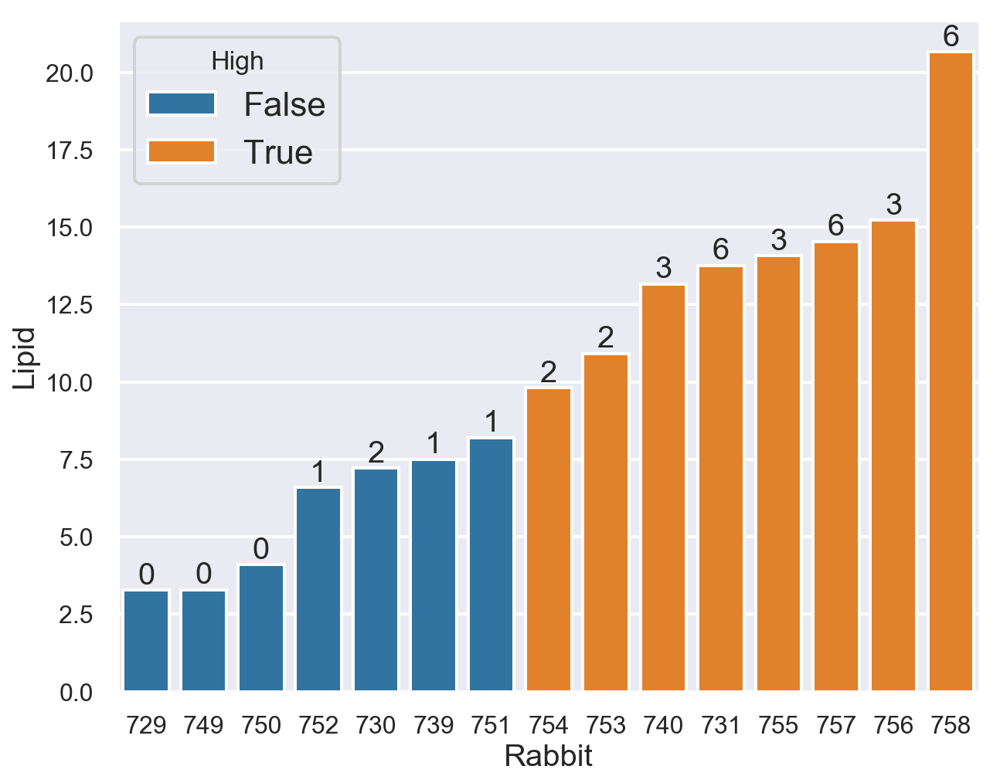

In [147]:
plt.figure(figsize = (10, 8))
ax = sns.barplot(x = 'Rabbit', y = 'Lipid', data = dataBase, hue = 'High',\
                 order=dataBase.Rabbit, dodge = False) 
count = 1
for p in ax.patches:
    height = p.get_height()
    if np.isnan(height):
        continue
    no_weeks = dataBase['Weeks on diet'][count]
    count = count + 1
    plt.text(p.get_x()+p.get_width()/2.,
            height + 0.2,
            no_weeks,
            ha="center") 

## Load BSC and ATT

In [9]:
#RIGHT_SIDE = ['750', '754', '753']

In [86]:
RIGHT_SIDE = ['750', '730']

In [87]:
ATTs_dict, freq_att_dict, freq_bsc_dict, depth_dict, BSCs_dict = {}, {}, {}, {}, {} 
left_dict, right_dict, top_dict, bottom_dict = {}, {}, {}, {} # ROIs of each BSC
att_bottom, bad_BSC = {}, {}

name_tag = 'fix_bug_average_ref_phantom_6MHz_v7_12a_30b'
for idx, row in dataBase.iterrows():
    number = str(int(row.Rabbit))
    print(number, end = ', ')
    if number in RIGHT_SIDE:
        path = "/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L" + number + "/L94_right/BSC_ATT/"
    else:
        path = "/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L" + number + "/L94_left/BSC_ATT/"
    ATTs_dict[number], freq_att_dict[number], BSCs_dict[number], freq_bsc_dict[number], \
    depth_dict[number], left_dict[number], right_dict[number], \
    top_dict[number], bottom_dict[number], att_bottom[number], bad_BSC[number] = getBSC_Att(path,name_tag)

729, 749, 750, 752, 730, 739, 751, 754, 753, 740, 731, 755, 757, 756, 758, 

In [46]:
rf_hdf5_path = '/Volumes/TrongDrive/Liver_Study/RF_hdf5/'
root_path = '/Volumes/TrongDrive/Liver_Study/PostProcessedFiles/L'

# BSC analysis

## Average BSC for all rabbits

In [88]:
def filter_bsc(bscs):
    """
    Filter bscs in a frame
    """
    new_bsc = []
    good_idx = []
    for i in range(bscs.shape[1]):
        one_bsc = bscs[:, i]
        if np.isinf(one_bsc).any():
            continue
        if not (np.where(one_bsc ==0)[0].size > 0): # there is a zero 
            new_bsc.append(one_bsc)
            good_idx.append(i)
    if (len(new_bsc) == 0):
        return []
    return (np.vstack(new_bsc).T, np.array(good_idx))

167.056141183 28.5386555095 3.27 729
181.62535388 22.7087275169 3.29 749
175.35758703 32.9468901034 4.1 750
166.49675665 23.030602649 6.6 752
151.955714219 24.0138952626 7.22 730
162.226006475 22.9312947402 7.5 739
134.62088884 30.5243567177 8.2 751
191.622088253 13.2231644023 9.81 754
203.423319803 11.6980053385 10.92 753
171.268716655 20.1127621759 13.17 740
180.105634307 23.6588345425 13.76 731
158.886017795 15.8154238602 14.08 755
170.070367815 20.1622332863 14.54 757
173.425391989 19.356995477 15.23 756
168.241954094 21.1254160476 20.66 758


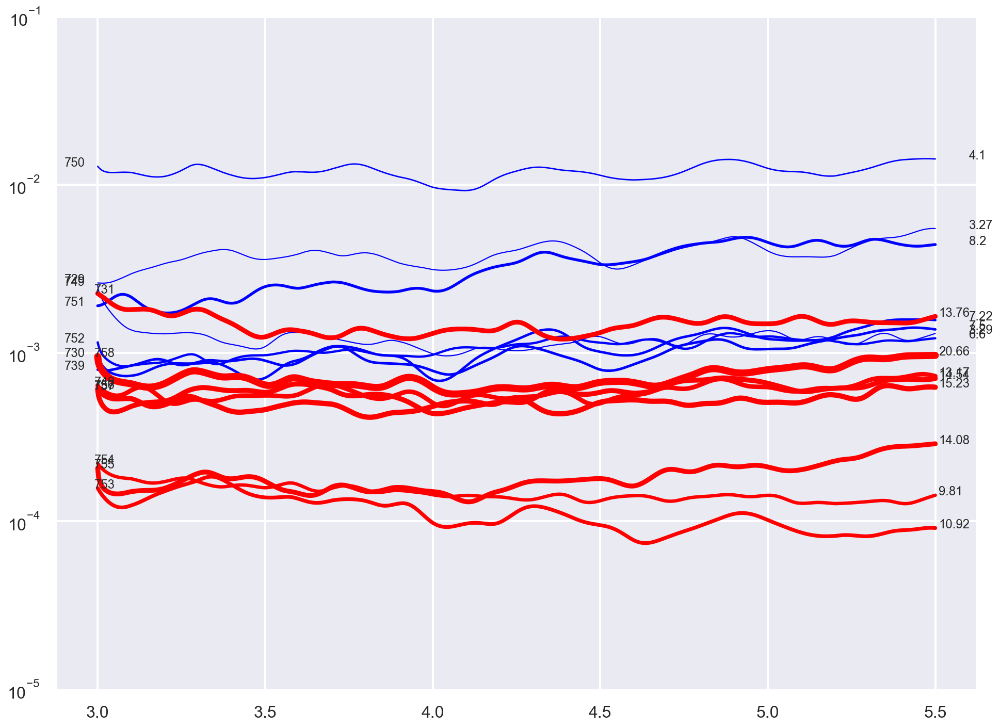

In [90]:
mean_red  = []
mean_blue = []

plt.figure(figsize = (16, 12))
for idx, row in dataBase.iterrows():
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    #if rabbit_number == '750':
    #    continue
    
    #plt.figure(figsize = (16, 12))
    bscs = BSCs_dict[rabbit_number]
    if (len(bscs) == 0):
        print(rabbit_number)
        continue
    freq_key = next(iter(freq_bsc_dict[rabbit_number]))
    freq = freq_bsc_dict[rabbit_number][freq_key].flatten()
    
    rabbit_bsc = []
    for frame_ in bscs:
        if (bscs[frame_].shape[1] > 0):
            bsc_filter, good_idxs = filter_bsc(bscs[frame_])
            if (len(bsc_filter)>0):
                avg_bsc = np.mean(bsc_filter, axis = 1)
                rabbit_bsc.append(avg_bsc)

    if (len(rabbit_bsc) ==0):
        continue
    rabbit_bsc  = np.mean(np.vstack(rabbit_bsc), axis = 0)
    if (np.isnan(rabbit_bsc).any()):                
        bsc_nan = rabbit_bsc
        print(bsc_nan)
        print(rabbit_number)
    if (lipid > threshold_lipid):
        plt.semilogy(freq, rabbit_bsc, color = 'red', linewidth = lipid /3.0) 
       
        if (not np.isnan(rabbit_bsc).any()):
            mean_red.append(rabbit_bsc)
            try:
                esd, eac = get_ESD_EAC(freq, np.mean(np.vstack(rabbit_bsc), axis=1))
            except:
                esd = 0
                eac = 0
            print(esd, eac, lipid, rabbit_number)
            plt.text(freq[-1] + 0.01 , rabbit_bsc[-1], str(lipid), fontsize = 12)
            plt.text(freq[0] - 0.01 , rabbit_bsc[0], rabbit_number, fontsize = 12)
    else:
        plt.semilogy(freq, rabbit_bsc, color = 'blue', linewidth = lipid /3.0)
        if (not np.isnan(rabbit_bsc).any()):
            mean_blue.append(rabbit_bsc)
            try:
                esd, eac = get_ESD_EAC(freq, np.mean(np.vstack(rabbit_bsc), axis=1))
            except:
                esd = 0
                eac = 0
            print(esd, eac, lipid, rabbit_number)
            plt.text(freq[-1] + 0.1, rabbit_bsc[-1], str(lipid), fontsize = 12)
            plt.text(freq[0] - 0.1 , rabbit_bsc[0], rabbit_number, fontsize = 12)
    plt.ylim([10**-5, 10**-1])
    #plt.show()

## Average BSC for two lipid classes

175.194556953 19.5365380152
167.607797077 27.866140822


(0.0001, 0.01)

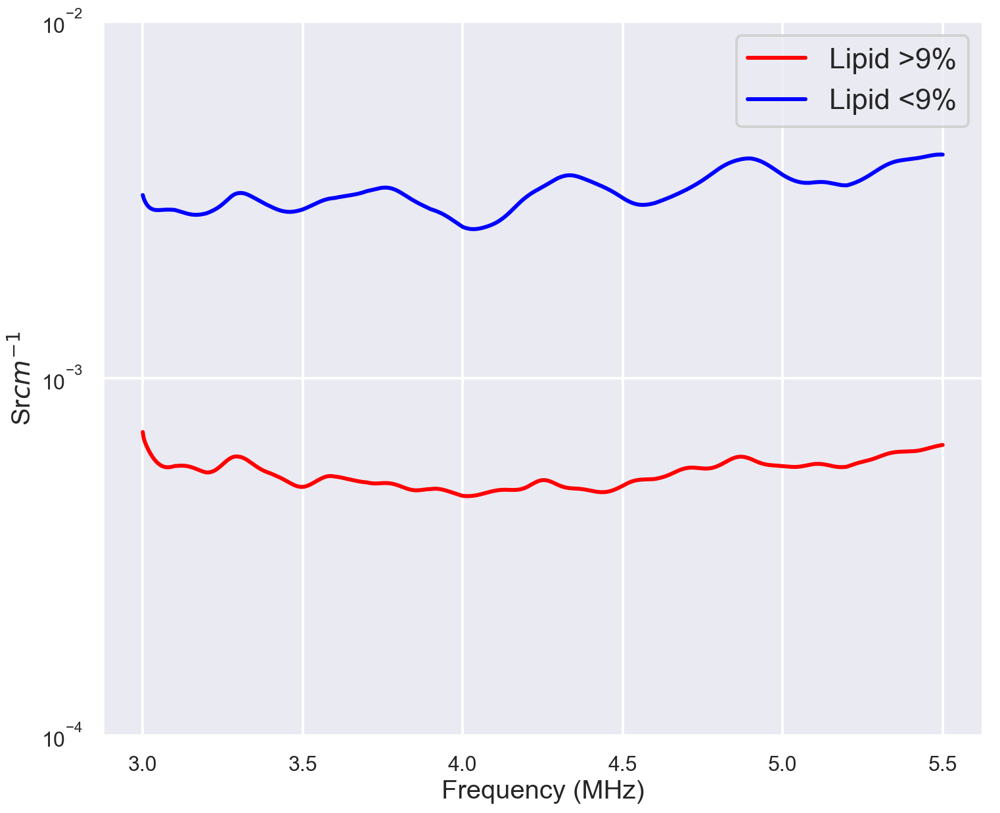

In [93]:
plt.figure(figsize = (12, 10))
plt.semilogy(freq, np.mean(np.vstack(mean_red), axis =0), color='red', \
             label = 'Lipid >' + str(threshold_lipid)+ '%')

esd, eac = get_ESD_EAC(freq, np.mean(np.vstack(mean_red), axis =0), type = 'gaussian')
print(esd, eac)

plt.semilogy(freq, np.mean(np.vstack(mean_blue), axis =0), color='blue',  \
             label = 'Lipid <' + str(threshold_lipid)+ '%')

esd, eac = get_ESD_EAC(freq, np.mean(np.vstack(mean_blue), axis =0), type = 'gaussian')
print(esd, eac)
plt.xlabel('Frequency (MHz)')
plt.ylabel('Sr$cm^{-1}$')
plt.legend()
plt.ylim([10**-4, 10**-2])

In [163]:
from scipy.io import savemat

bsc_python = {}
bsc_python['freq'] = freq
bsc_python['bsc'] = np.mean(np.vstack(mean_blue), axis = 0)

In [164]:
savemat('bsc_python_blue.mat', bsc_python)

## Average BSC for two classes

In [51]:
file_path = "/Users/trongnguyen/Downloads/CODE/BatchProcessing/TrongCode/BSC_trong/LO_FREQ_REF_6.20.11.txt"
data = pd.read_csv(file_path, sep="\t", header=None)
data.columns = ['Frequency', 'BSC']

In [52]:
freq_lo_ref = data.Frequency.as_matrix()
bsc_lo_ref = data.BSC.as_matrix()

Text(0.5,1,'BSC of the reference phantom')

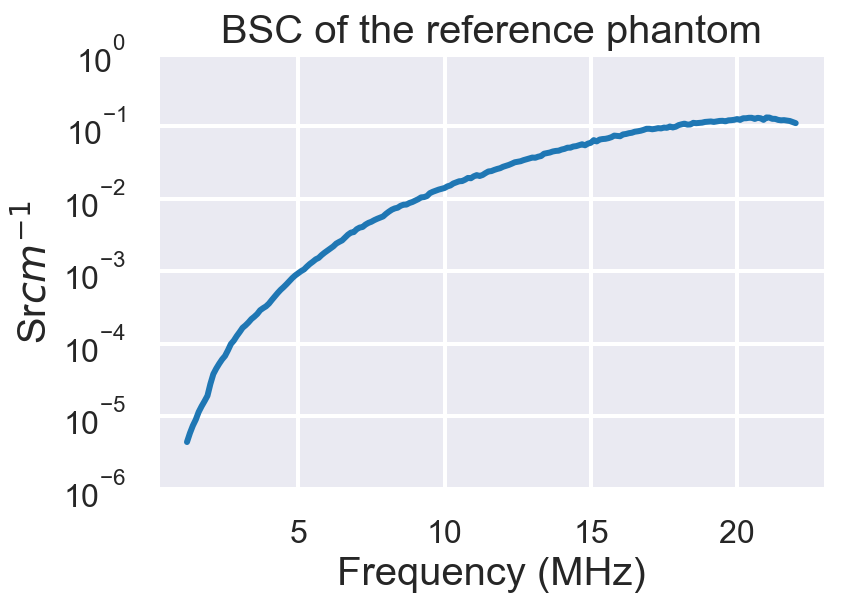

In [55]:
plt.semilogy(freq_lo_ref, bsc_lo_ref)
plt.xlabel('Frequency (MHz)')
plt.ylabel('Sr$cm^{-1}$')
plt.ylim([10**-6, 10**-0])
plt.title('BSC of the reference phantom')

In [35]:
bsc_low_lipid = np.vstack(mean_blue)
bsc_high_lipid = np.vstack(mean_red)
#sns.lineplot(x = freq, y = bsc_low_lipid[1, :])

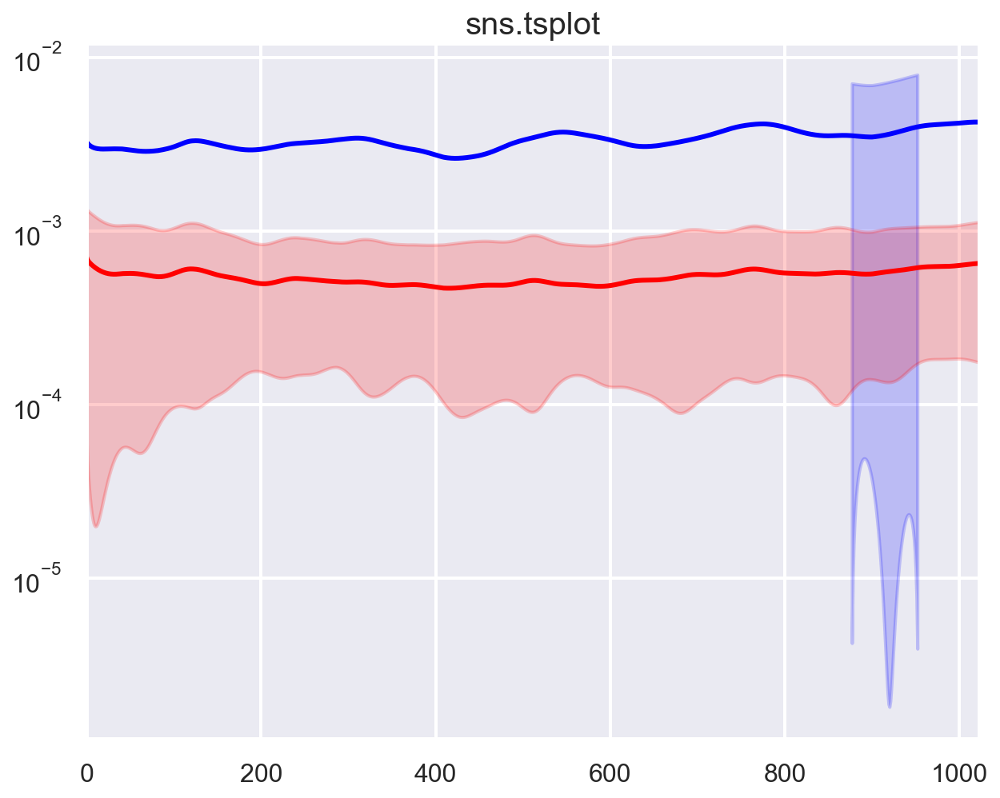

In [41]:
fig = plt.figure(figsize = (10, 8))
ax = fig.add_subplot(1, 1, 1)

def tsplot(ax, data,**kw):
    x = np.arange(data.shape[1])
    est = np.mean(data, axis=0)
    sd = np.std(data, axis=0)
    cis = (est - sd, est + sd)
    ax.set(yscale="log")
    positive = cis[0] > 0
    ax.fill_between(x,cis[0],cis[1],where=positive, alpha=0.2, **kw)
    ax.plot(x,est,**kw)
    #
    ax.margins(x=0)

tsplot(ax, bsc_low_lipid, color = 'b')
tsplot(ax, bsc_high_lipid, color = 'r')

ax.set_title("sns.tsplot")
plt.show()

/Users/trongnguyen/anaconda3/lib/python3.6/site-packages/seaborn/timeseries.py:183: UserWarning: The `tsplot` function is deprecated and will be removed in a future release. Please update your code to use the new `lineplot` function.
  warnings.warn(msg, UserWarning)


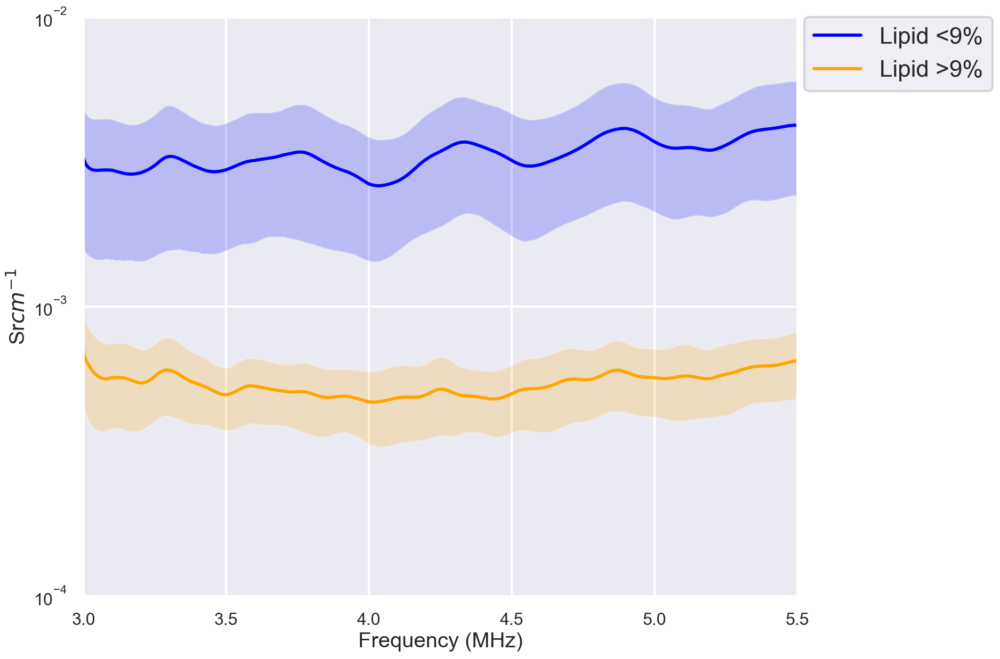

In [111]:
f, ax = plt.subplots(figsize=(12, 10))
ax.set(yscale="log")
sns.tsplot(data = np.vstack(mean_blue), time = freq,  color = 'blue', condition = 'Lipid <' + str(threshold_lipid)+ '%')
sns.tsplot(data = np.vstack(mean_red),time = freq,  color = 'orange', condition = 'Lipid >' + str(threshold_lipid)+ '%')
ax.set_xlabel('Frequency (MHz)')
ax.set_ylabel('Sr$cm^{-1}$')
ax.set_ylim([ 10**-4,10**-2])
plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)

## Form factor

In [13]:
esd, eac = get_ESD_EAC(freq, (low_lipid_mean_bsc))
print(esd, eac)

136.452246637 29.3572043807


# BSCs for each rabbits

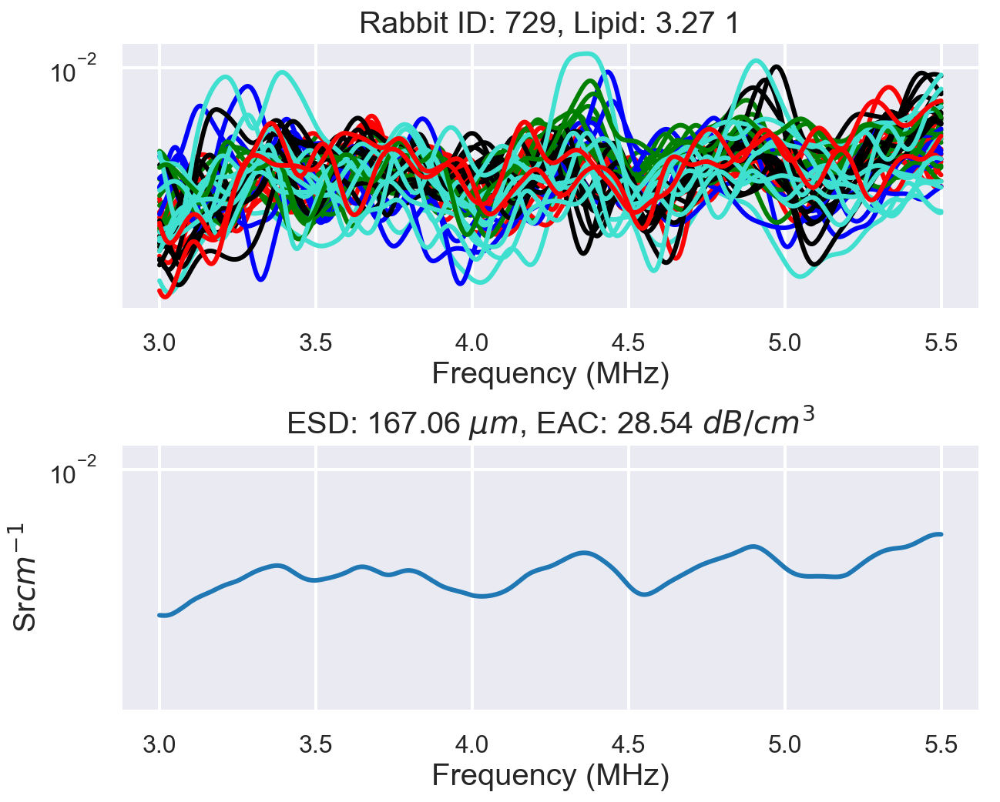

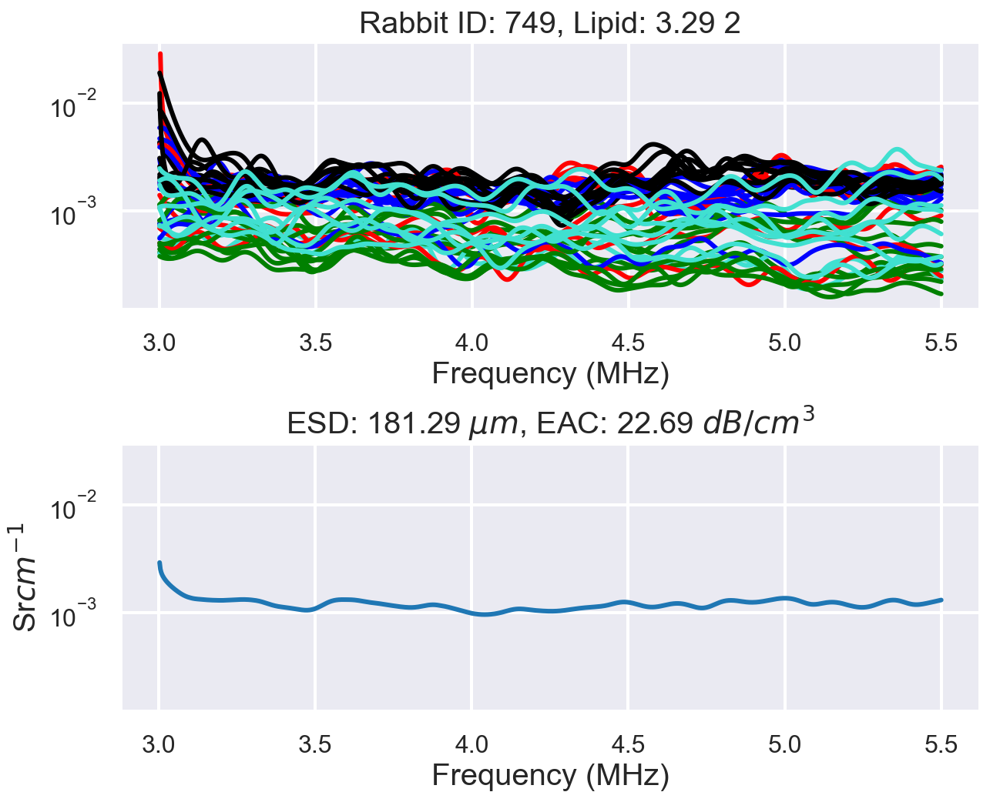

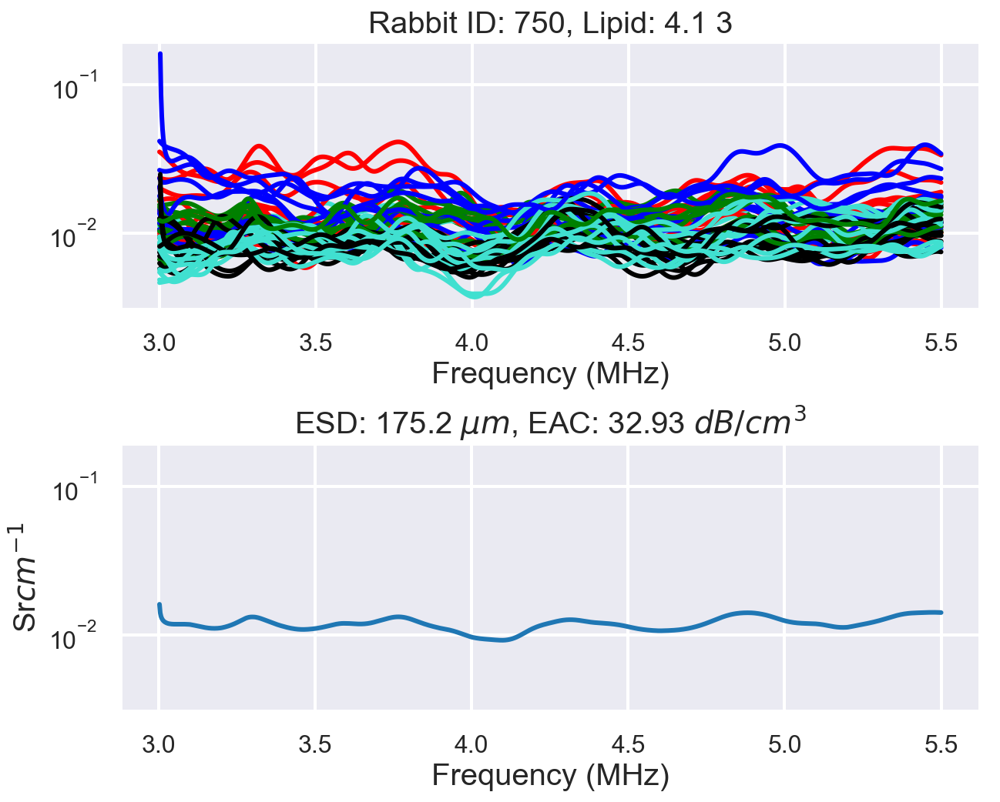

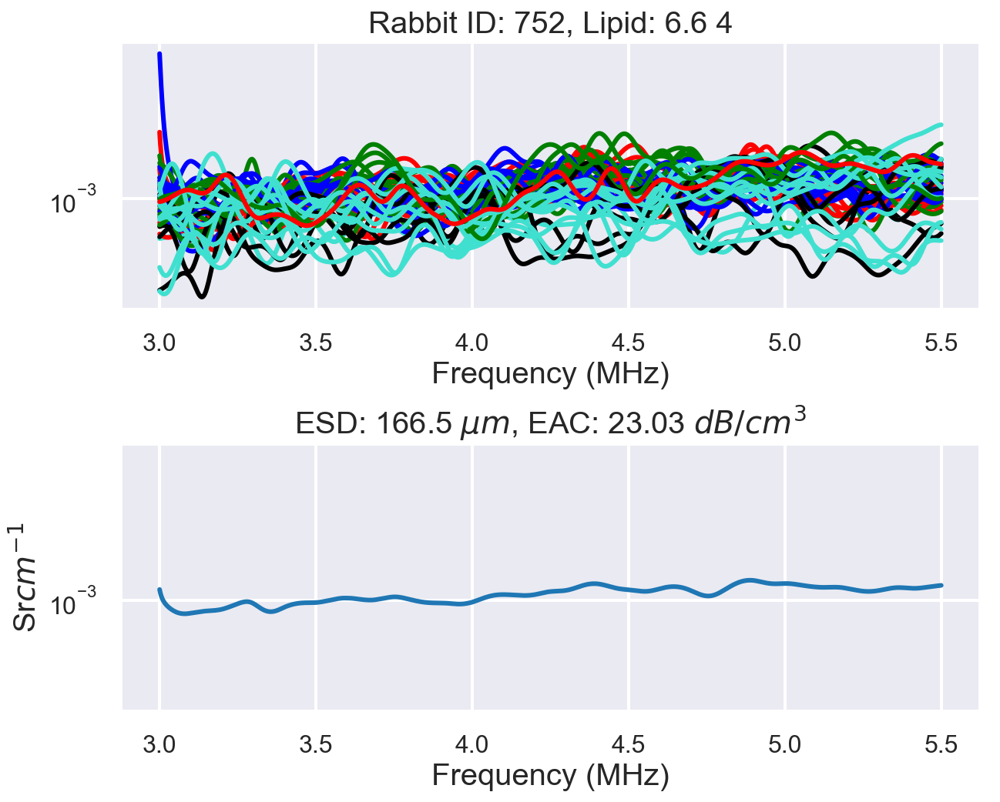

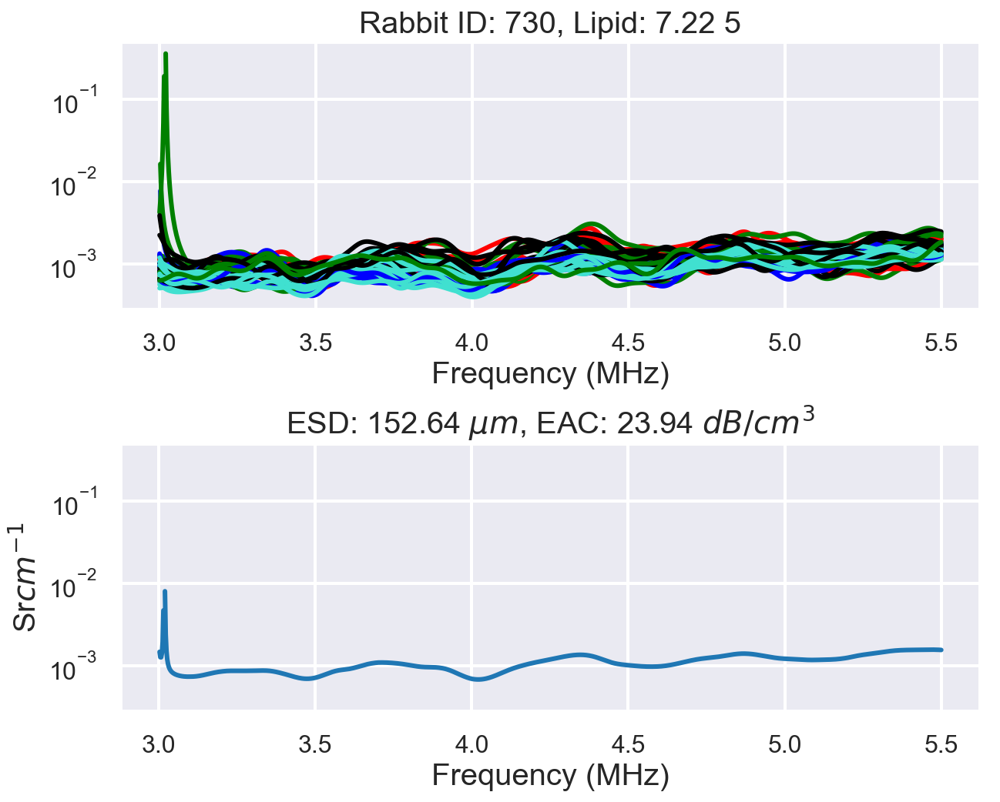

...

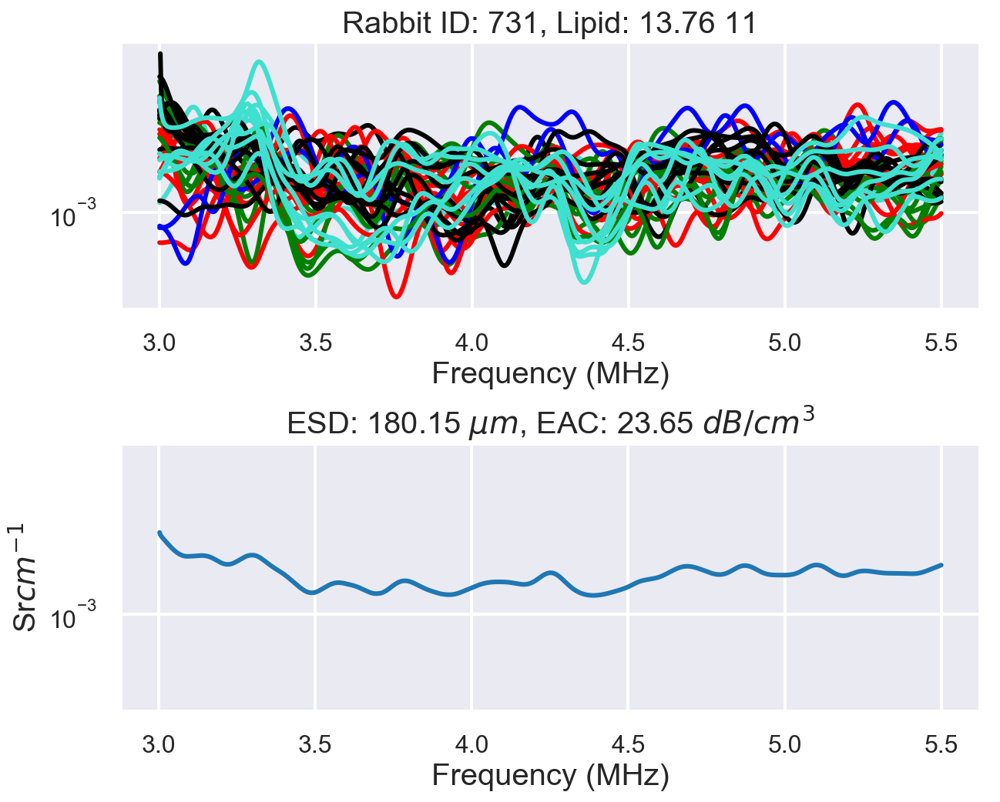

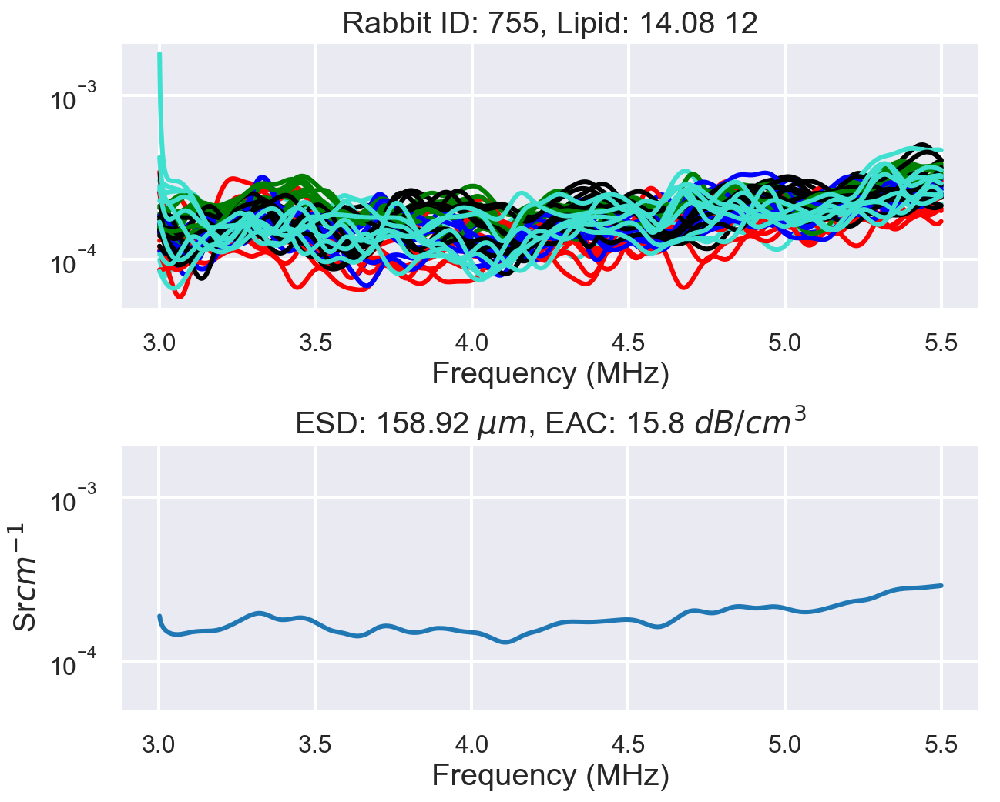

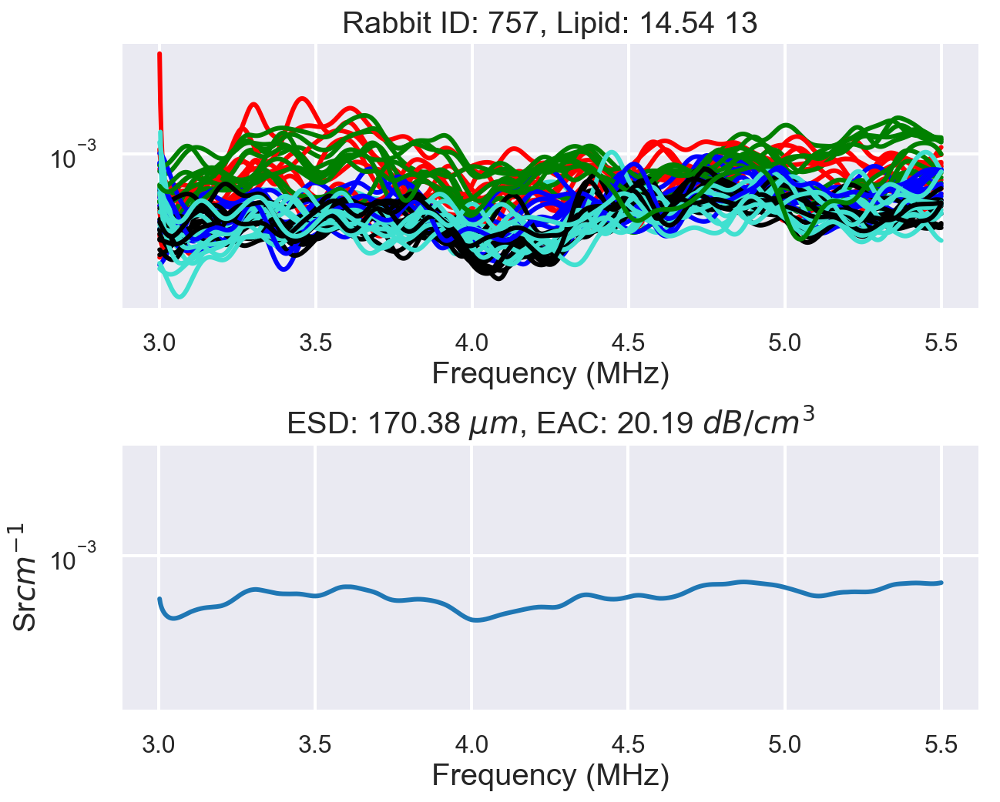

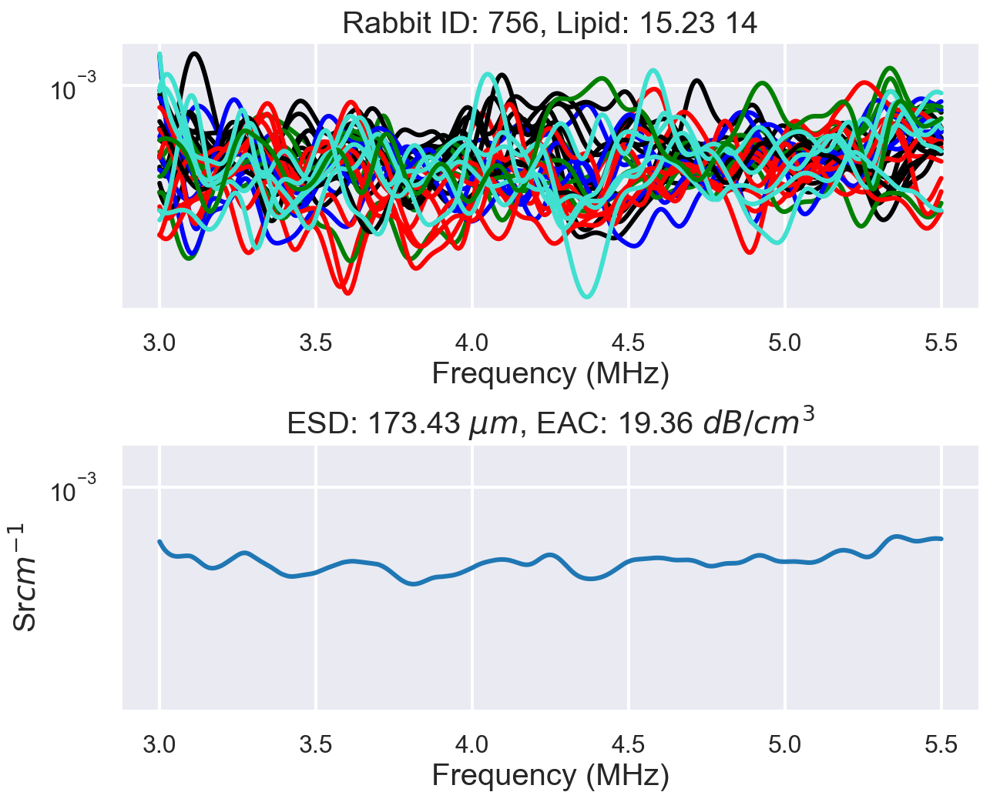

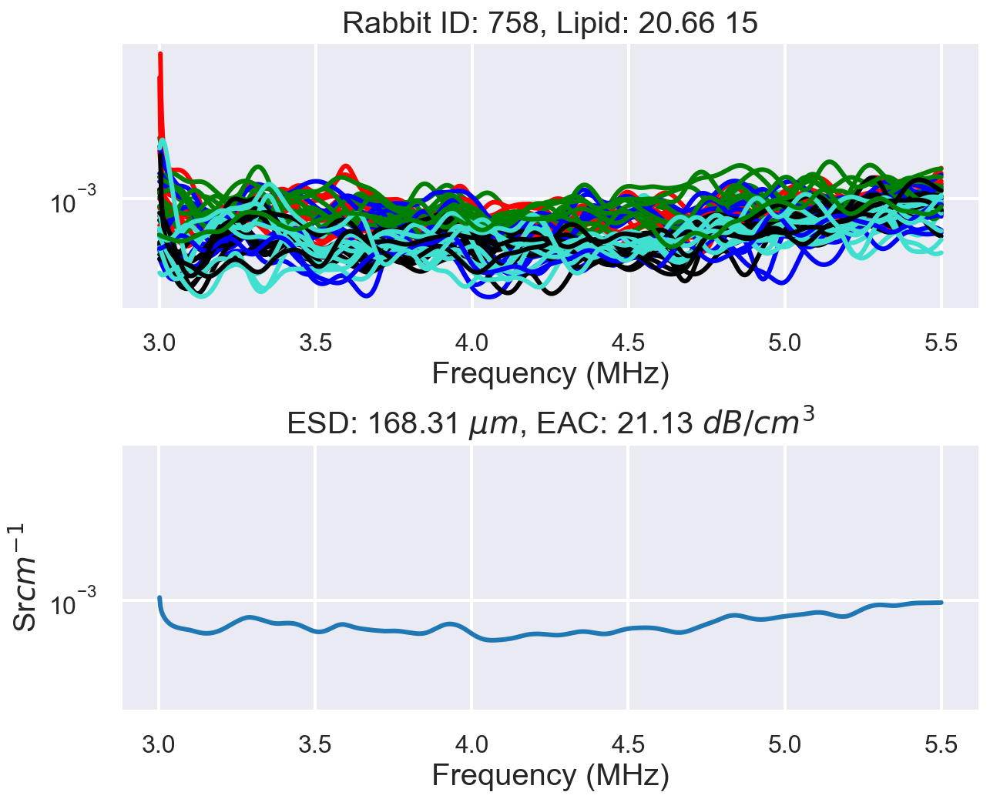

In [95]:
esd_dict = {}
eac_dict = {}

count = 0
for idx, row in dataBase.iterrows():
    count = count + 1
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    bscs = BSCs_dict[rabbit_number]
    depth = depth_dict[rabbit_number]
    
    if (len(bscs) == 0):
        continue
    freq_key = next(iter(freq_bsc_dict[rabbit_number]))
    freq = freq_bsc_dict[rabbit_number][freq_key].flatten()
    
    f, (ax1, ax2) = plt.subplots(2, 1, sharey = True, figsize = (10, 8))

    rabbit_bsc = []
    for frame_ in bscs:
        if (bscs[frame_].shape[1] > 0):
            avg_bsc = np.mean(bscs[frame_], axis = 1)
            no_rois = bscs[frame_].shape[1]
            max_depth = np.round(np.max(depth[frame_]))
            min_depth = np.round(np.min(depth[frame_]))
            range_depth = str(min_depth) +'-' +str(max_depth)
            if (no_rois >0):
                ax1.semilogy(freq, avg_bsc, color = filter_frame(frame_), label = str(frame_))
                rabbit_bsc.append(avg_bsc)
    
    ax2.semilogy(freq, np.mean(np.vstack(rabbit_bsc), axis = 0))
    try:
        temp2, idxs = filter_bsc(np.vstack(rabbit_bsc).T)
        esd, eac = get_ESD_EAC(freq, np.mean(temp2, axis = 1))
        esd_dict[lipid] = esd
        eac_dict[lipid] = eac
    except:
        esd = 0
        eac = 0
    
    ax1.set_title("Rabbit ID: " + rabbit_number + ", Lipid: " + str(lipid) +" "+ str(count))
    #ax1.set_ylim([10**-5, 10])
    ax1.set_xlabel('Frequency (MHz)')
    ax2.set_xlabel('Frequency (MHz)')
    ax2.set_ylabel('Sr$cm^{-1}$')
                           
    ax2.set_title("ESD: " + str(np.round(esd,2)) + " $\mu m$, EAC: " \
                  + str(np.round(eac, 2)) + " $dB/cm^3$")
    f.subplots_adjust(hspace = 0.5)
    #plt.legend(bbox_to_anchor=(1.1, 1.05), ncol=3)
    #plt.xlabel('Frequency (MHz)')
    #plt.ylabel('Sr$cm^{-1}$')
    plt.show()

In [96]:
df = pd.DataFrame({'ESD':pd.Series(esd_dict),'EAC':pd.Series(eac_dict)})

In [97]:
df['Lipid'] = df.index

In [98]:
df['High'] = df.Lipid > threshold_lipid

In [99]:
df['High_fat'] = df['High'].apply(lambda x: 'High fat' if x else 'Low fat')

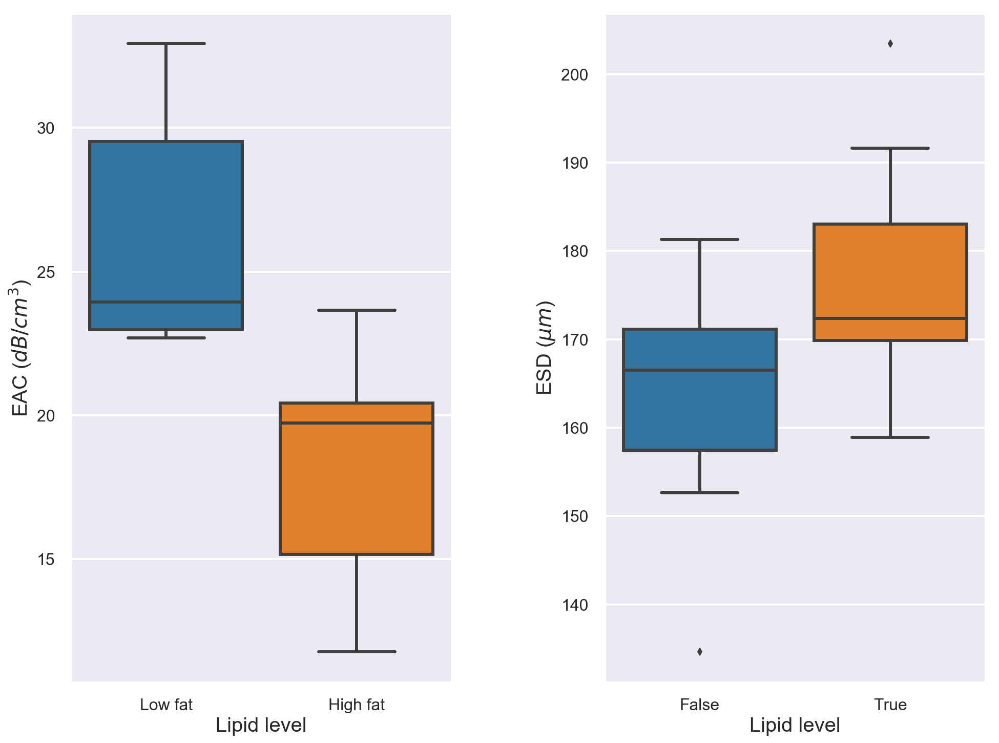

In [100]:
plt.figure(figsize = (16, 12))
plt.subplot(121)
sns.boxplot(x = 'High_fat', y = 'EAC', data = df)
plt.ylabel('EAC ($dB/cm^3$)')
plt.xlabel('Lipid level')
plt.subplot(122)
sns.boxplot(x = 'High', y = 'ESD', data = df)
plt.ylabel('ESD ($\mu m$)')
plt.xlabel('Lipid level')
plt.subplots_adjust(wspace = 0.4)

In [21]:
from scipy.stats import ttest_ind

In [45]:
ttest_ind(df.eac[df.High == False], df.eac[df.High == True])

Ttest_indResult(statistic=3.8037475002540244, pvalue=0.0021916788813007636)

In [46]:
ttest_ind(df.esd[df.High == False], df.esd[df.High == True])

Ttest_indResult(statistic=-1.8826165752939599, pvalue=0.082323348647731692)

In [27]:
df['eac'].groupby(df['High']).describe()

,count,mean,std,min,25%,50%,75%,max
High,,,,,,,,
False,7.0,26.369258,4.230688,22.692466,22.980949,23.938596,29.531506,32.928836
True,8.0,18.152221,4.124782,11.763785,15.157349,19.734879,20.421139,23.646783


In [28]:
df['esd'].groupby(df['High']).describe()

,count,mean,std,min,25%,50%,75%,max
High,,,,,,,,
False,7.0,162.789018,15.411229,134.620889,157.431026,166.496757,171.127316,181.288799
True,8.0,177.191247,14.219402,158.923322,169.858271,172.347054,183.018447,203.458278


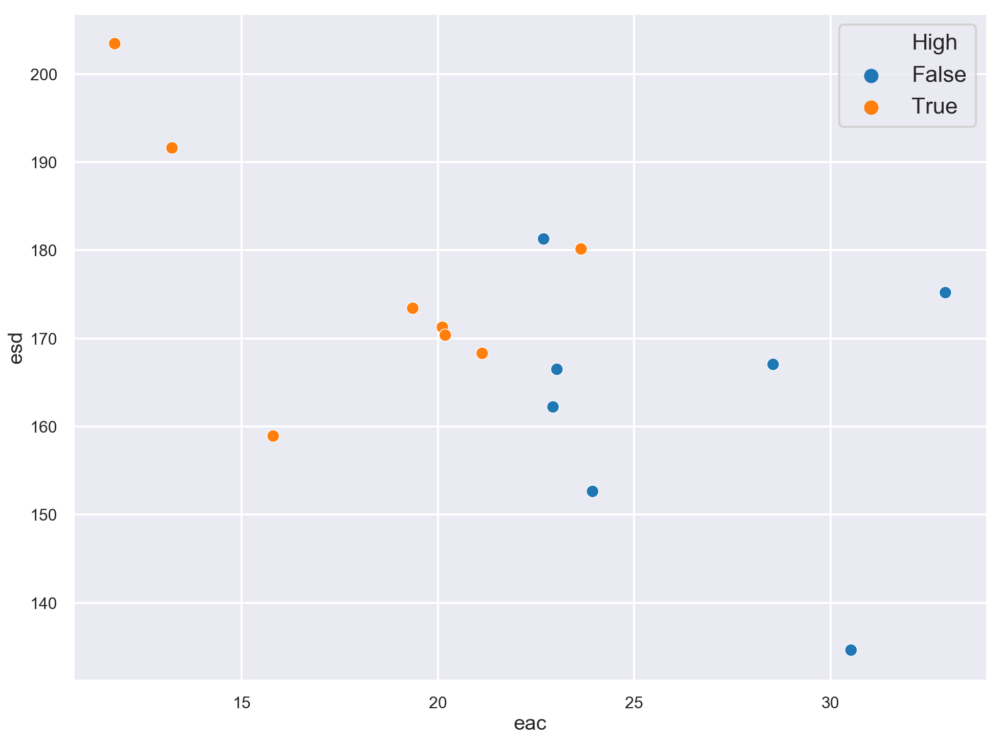

In [29]:
plt.figure(figsize = (16, 12))
sns.scatterplot(x = 'eac', y = 'esd', data = df, hue = 'High')

# Attenuation 

In [101]:
from sklearn.ensemble import IsolationForest
def filter_ATT_curve(freq, att_curves):
    #from IPython.core.debugger import Tracer; Tracer()() 
    slopes = []
    intercepts = []
    
    for idx in range(att_curves.shape[0]):
    
        slope, intercept = np.polyfit(freq, att_curves[idx], 1)
        slopes.append(slope)
        intercepts.append(slope * freq[int(freq.shape[0]/2)]+ intercept)

    xs = np.array(slopes)
    ys = np.array(intercepts)

    X = np.vstack((xs, ys))

    clf = IsolationForest(max_samples=xs.shape[0], contamination=0.4)
    clf.fit(X.T)
    outlier_idx = np.where(clf.predict(X.T) == -1)[0]
    inline_idx = np.delete(np.arange(att_curves.shape[0]), outlier_idx)
    att_inliner = att_curves[inline_idx, :]
    print(att_curves.shape, att_inliner.shape)
    return att_inliner

Threshold lipid 9.000000
729
(15, 1024) (9, 1024)
749
(19, 1024) (11, 1024)
750
(19, 1024) (11, 1024)
752
(17, 1024) (10, 1024)
730
(19, 1024) (11, 1024)
739
(15, 1024) (9, 1024)
751
(13, 1024) (8, 1024)
754
(19, 1024) (11, 1024)
753
(19, 1024) (11, 1024)
740
(19, 1024) (11, 1024)
731
(17, 1024) (10, 1024)
755
(19, 1024) (11, 1024)
757
(19, 1024) (11, 1024)
756
(17, 1024) (10, 1024)
758
(19, 1024) (11, 1024)


Text(0.5,1,'Attenuation for all of the rabbits')

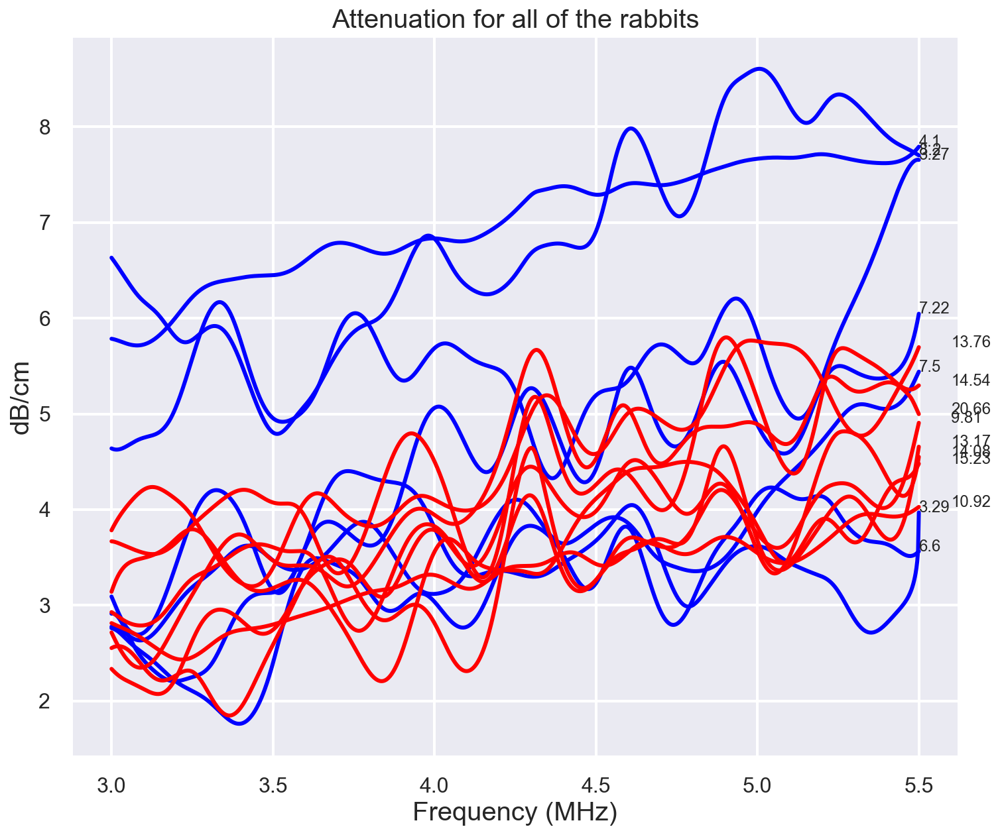

In [103]:
plt.figure(figsize = (12, 10))
mean_att_red  = []
mean_att_blue = []
print("Threshold lipid %f" % threshold_lipid )
for idx, row in dataBase.iterrows():
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    print(rabbit_number)
    #if rabbit_number == '751':
    #    continue
    atts = ATTs_dict[rabbit_number]
    if (len(atts) == 0):
        continue 
    freq_key = next(iter(freq_att_dict[rabbit_number]))
    freq = freq_att_dict[rabbit_number][freq_key].flatten()
    
    rabbit_att = []
    for frame_ in atts:
        if (atts[frame_].shape[1] > 0):
            #print(atts[frame_].shape[1], end = ',')
            avg_att = np.mean(atts[frame_], axis = 1)
            frame_no = int(frame_)
            if (frame_no > 15) and (frame_no < 35):
                rabbit_att.append(avg_att) #mean att in each frame

    if (len(rabbit_att) ==0):
        continue
    rabbit_att  = filter_ATT_curve(freq, np.vstack(rabbit_att))
    #break
    rabbit_att  = np.mean(rabbit_att, axis = 0) #mean att for each rabbit
    
    if (lipid > threshold_lipid):
        plt.plot(freq, rabbit_att, color = 'red') 
        mean_att_red.append(rabbit_att)
        plt.text(freq[-1] + 0.1, rabbit_att[-1], str(lipid), fontsize = 12)
    else:
        plt.plot(freq, rabbit_att, color = 'blue')
        mean_att_blue.append(rabbit_att)
        plt.text(freq[-1] , rabbit_att[-1], str(lipid), fontsize = 12)
    #print("/")
    #plt.show()
plt.xlabel('Frequency (MHz)')
plt.ylabel('dB/cm')
plt.title('Attenuation for all of the rabbits')

## Attenuation for two classes

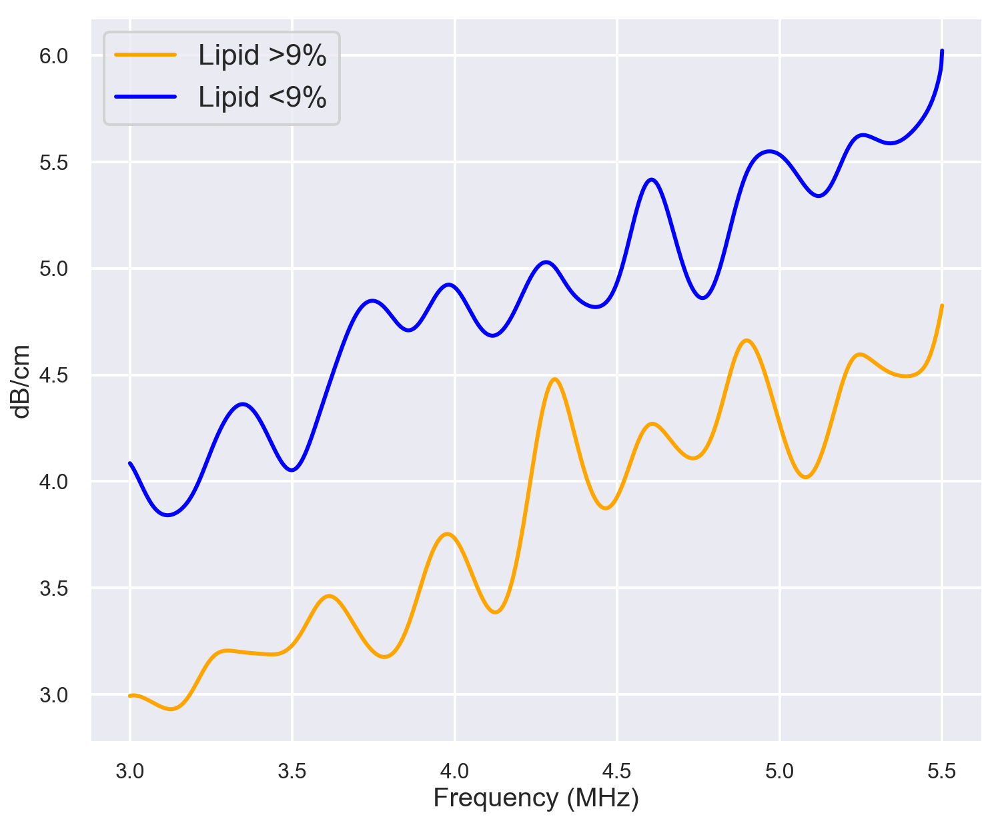

In [110]:
plt.figure(figsize = (12, 10))
high_fat_att = np.mean(np.vstack(mean_att_red), axis =0)
low_fat_att = np.mean(np.vstack(mean_att_blue), axis =0)
plt.plot(freq, high_fat_att, color = 'orange', label = 'Lipid >' + str(threshold_lipid)+ '%')
plt.plot(freq, low_fat_att, color = 'blue', label = 'Lipid <' + str(threshold_lipid)+ '%')
plt.xlabel('Frequency (MHz)')
plt.ylabel('dB/cm')
plt.legend()

In [106]:
slope1, intercept1 = np.polyfit(freq, high_fat_att, 1)

In [107]:
print(slope1, intercept1)
print(slope1 * 4.25 + intercept1)

0.714672719874 0.776922468247
3.81428152771


In [108]:
slope2, intercept2 = np.polyfit(freq, low_fat_att, 1)

In [109]:
print(slope2, intercept2)
print(slope2 * 4.25 + intercept2)

0.706958092949 1.86989829844
4.87447019348


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
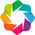

In [35]:
import holoviews as hv
hv.extension('bokeh')

In [46]:
freqz, nor_ps, ps, phaze = frequencyAnalysis.FrequencySpectrum(high_fat_att, 512, 4)

In [80]:
from scipy.signal import butter, lfilter, freqs

In [103]:
nyq = 0.5 * 512
low = 0.6 / nyq
high = 0.8 / nyq
#b, a = butter(4, [low, high], btype='bandstop')
b, a = butter(5, 0.01)
y = lfilter(b, a, low_fat_att)

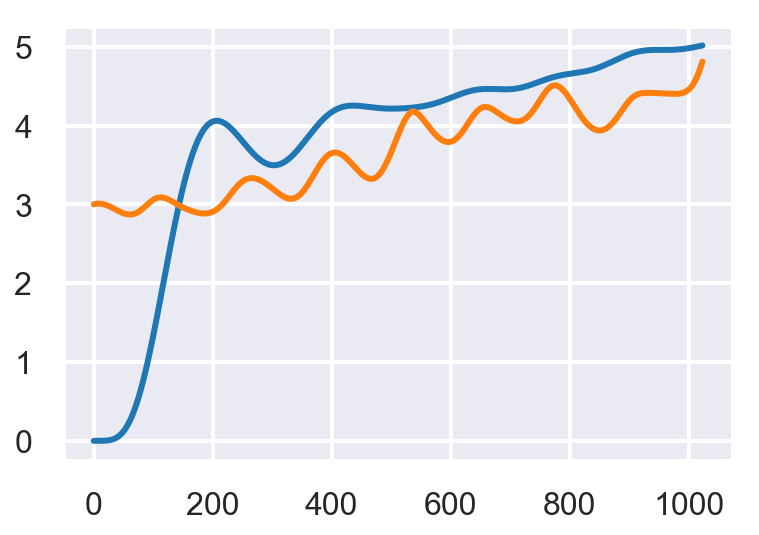

In [104]:
plt.plot(y)
plt.plot(high_fat_att)

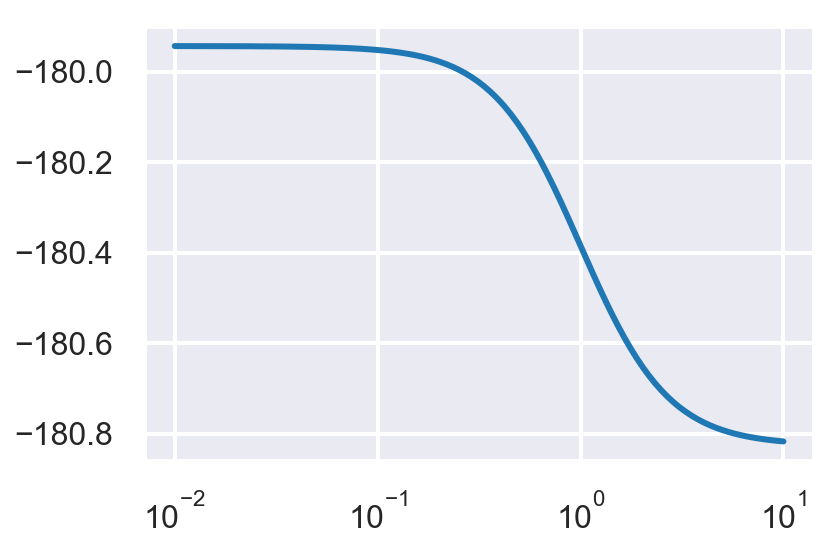

In [97]:
w, h = freqs(b, a)
plt.semilogx(w, 20 * np.log10(abs(h)))

In [71]:
low

0.0046875

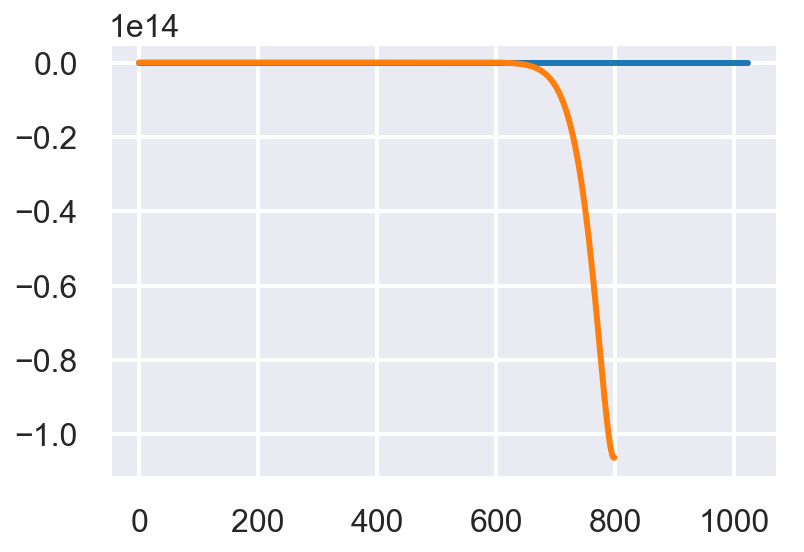

In [60]:
plt.plot(high_fat_att)
plt.plot(y[:800])

In [47]:
%%output size=150
curve = hv.Curve((freqz, ps))
curve

:Curve   [x]   (y)

# ATT for each rabbit

In [72]:
frame_

'44'

729


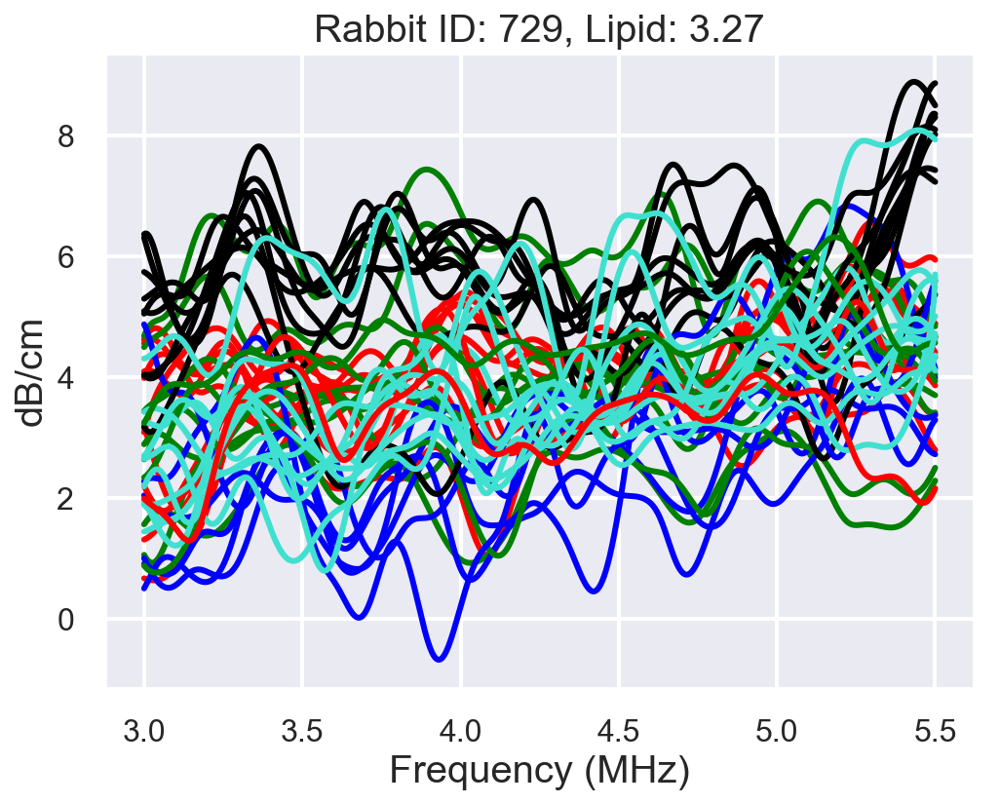

749


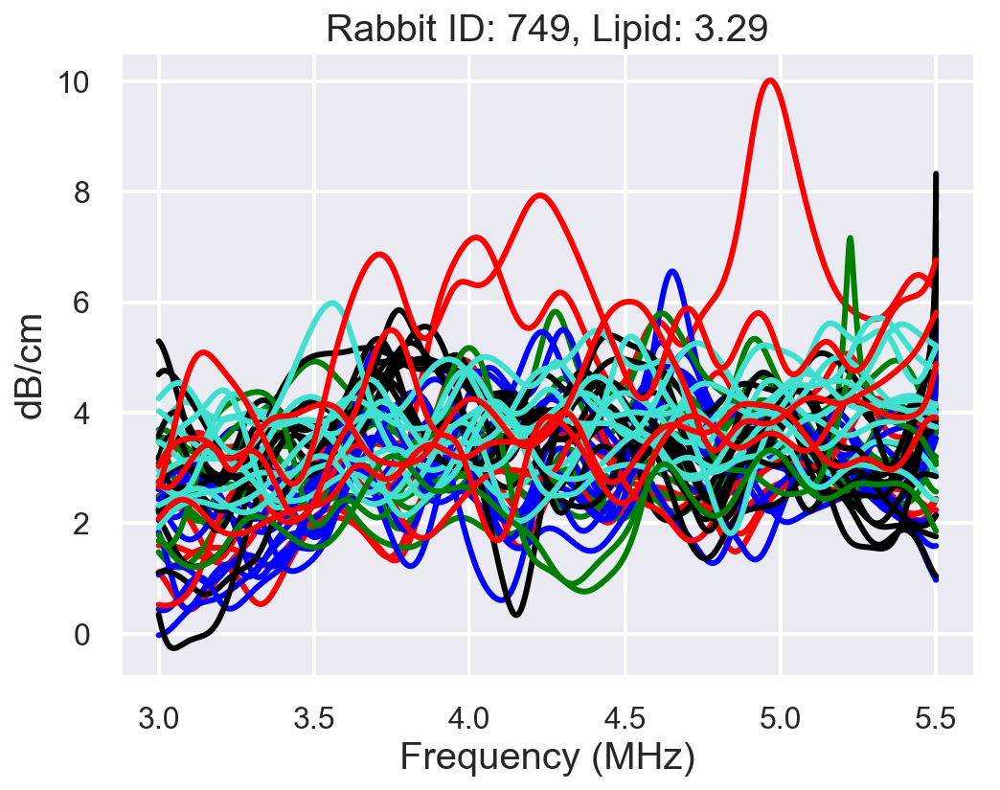

750


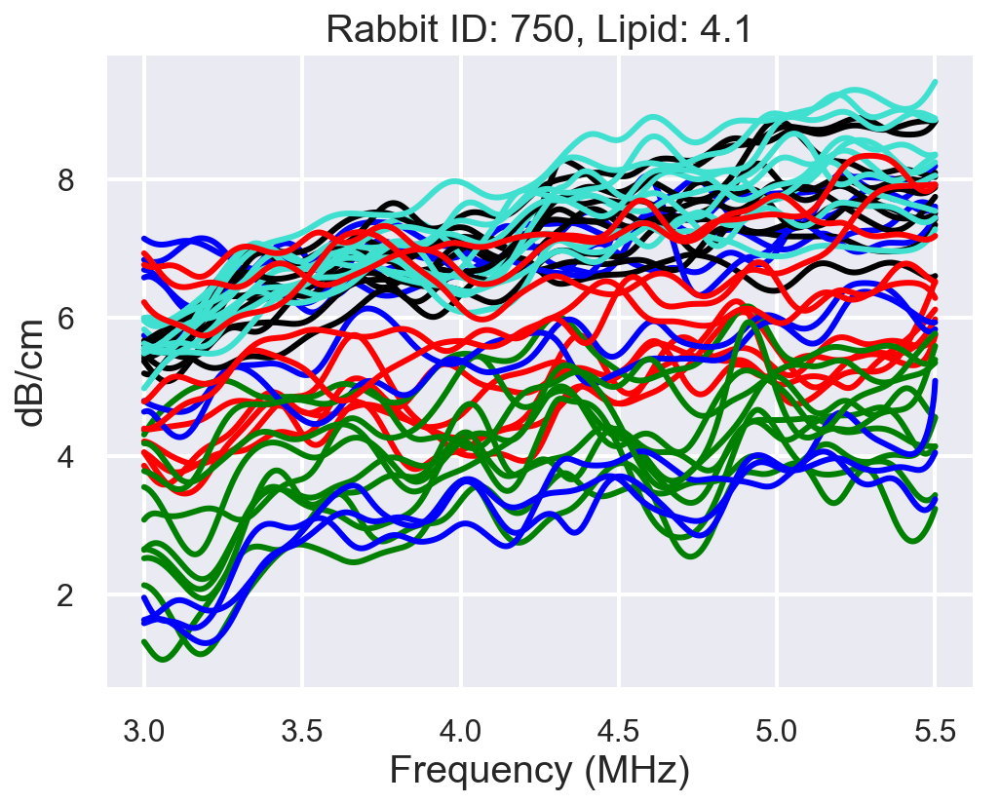

752


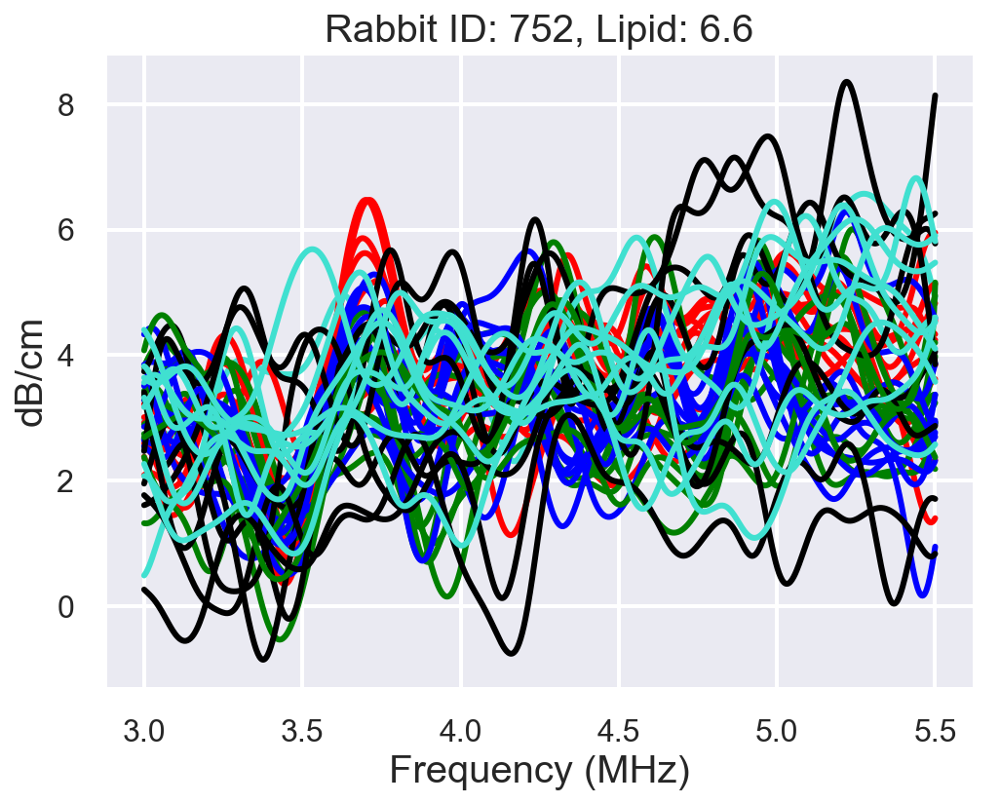

730


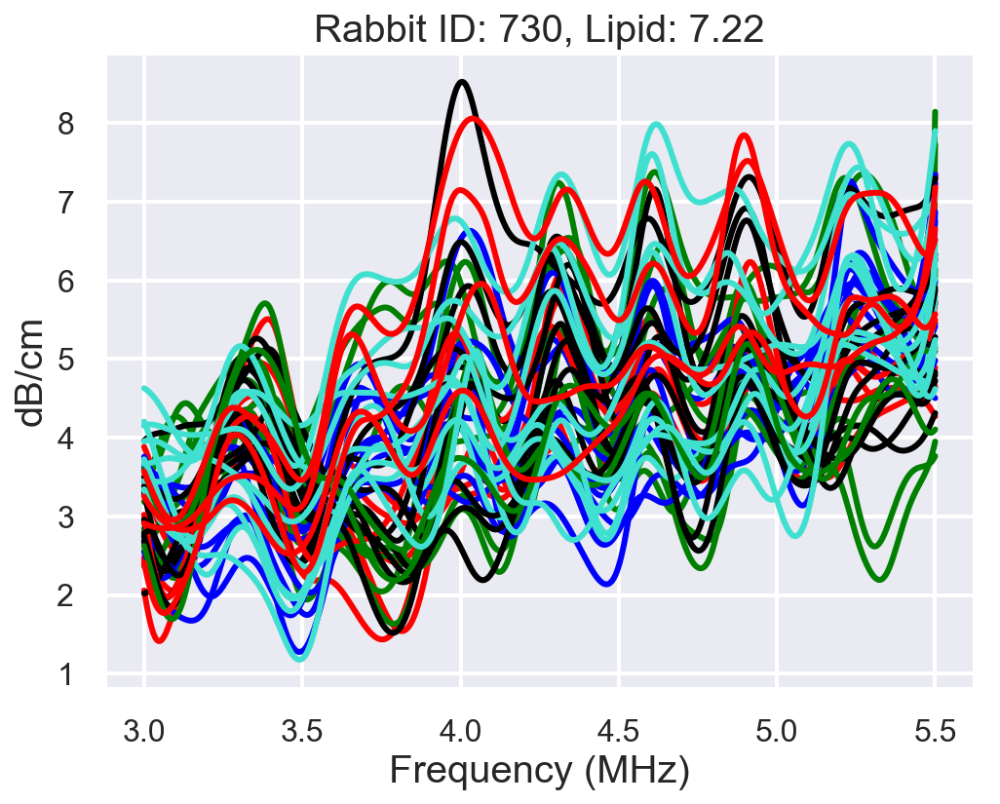

739


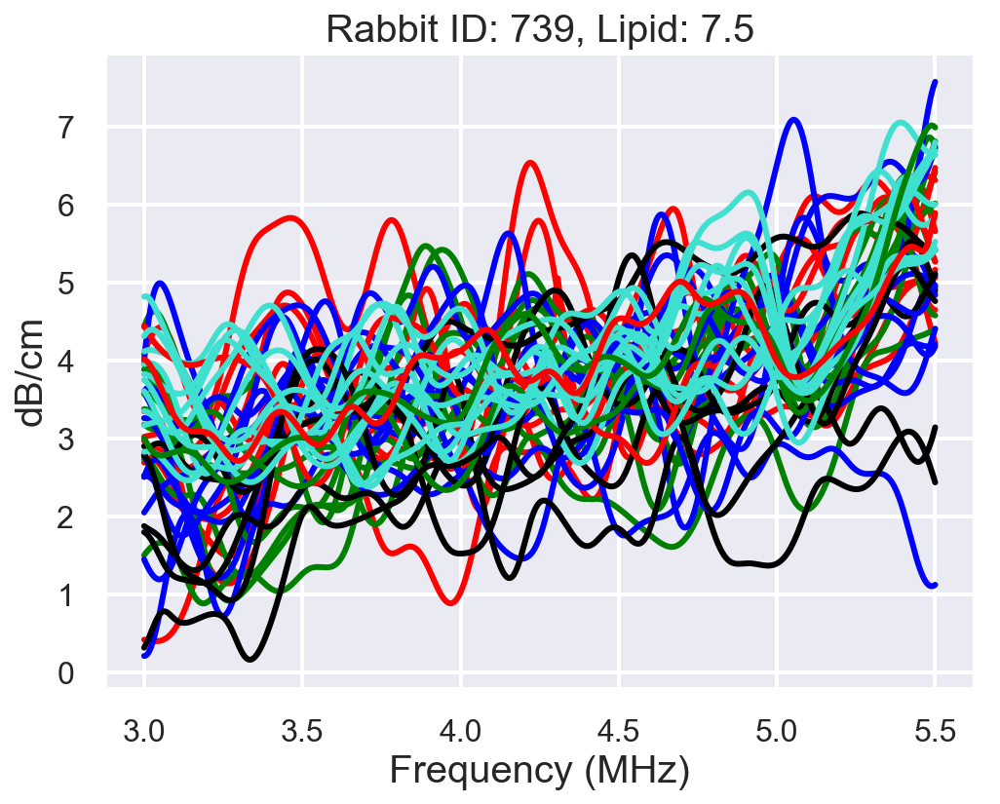

751


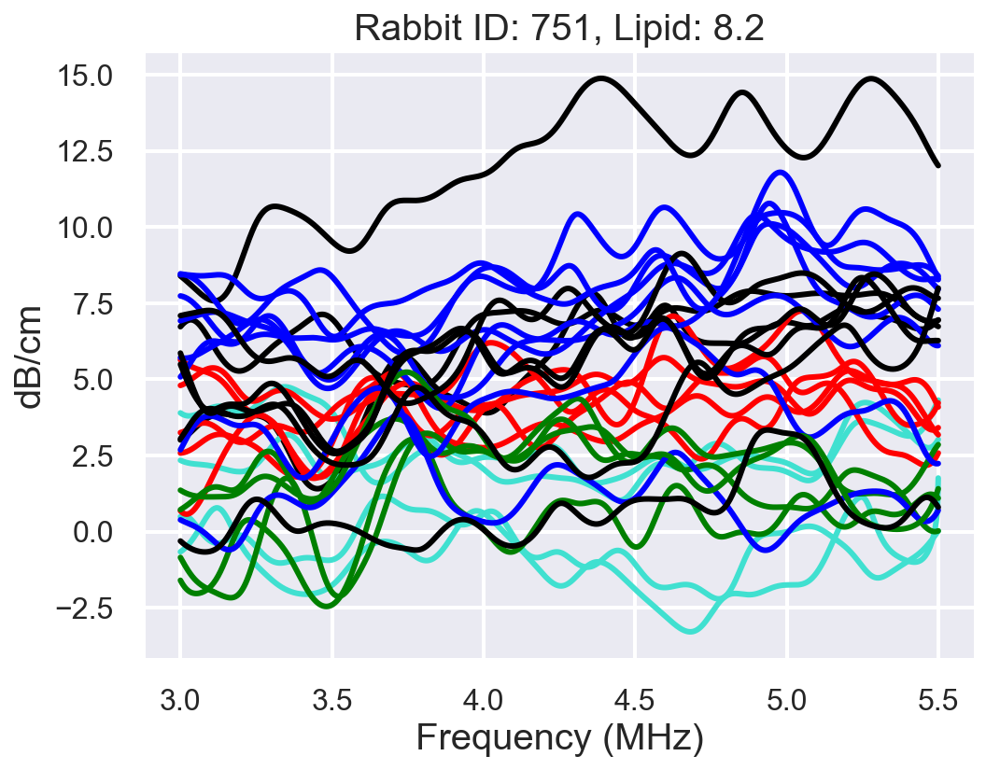

754


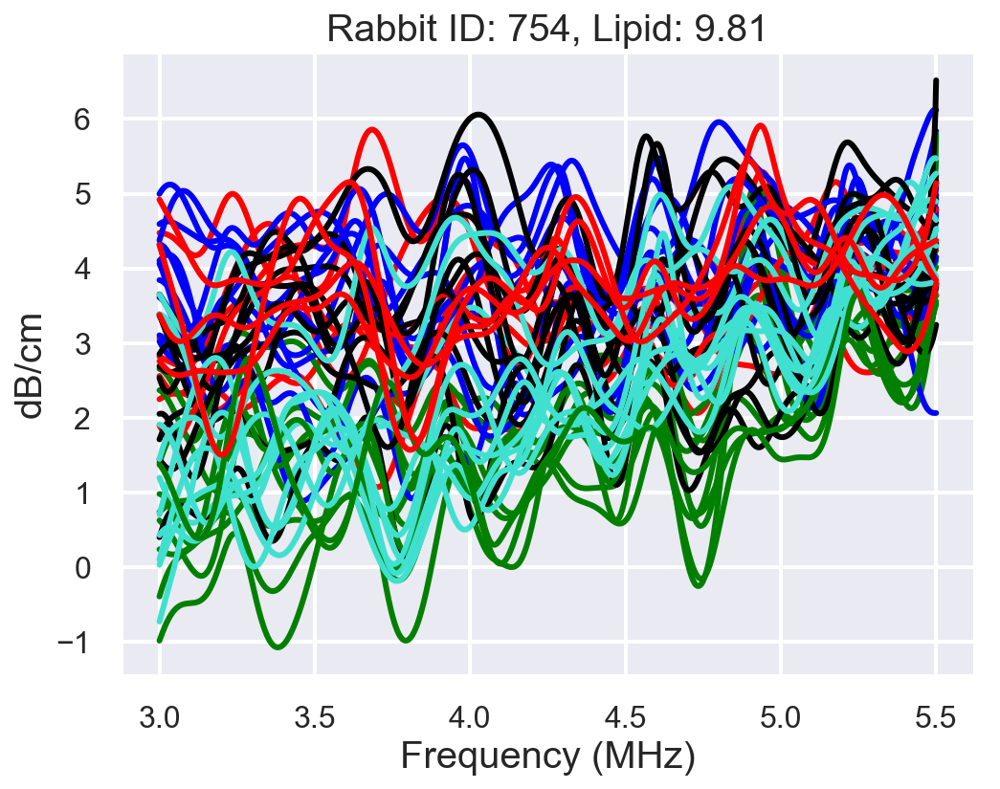

753


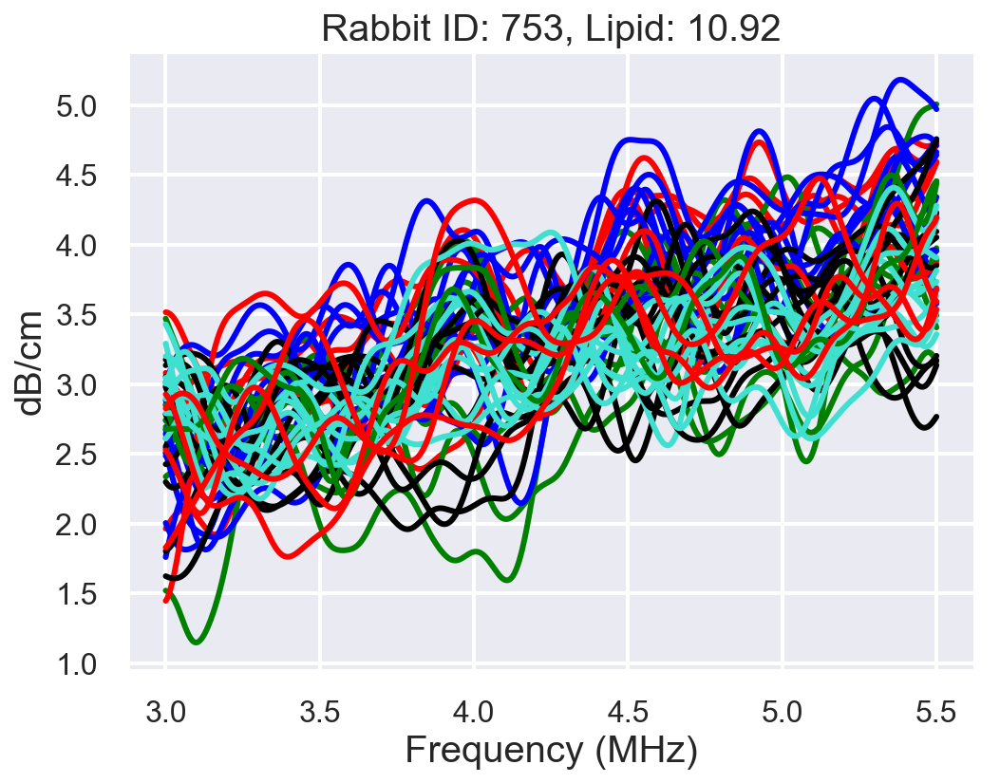

740


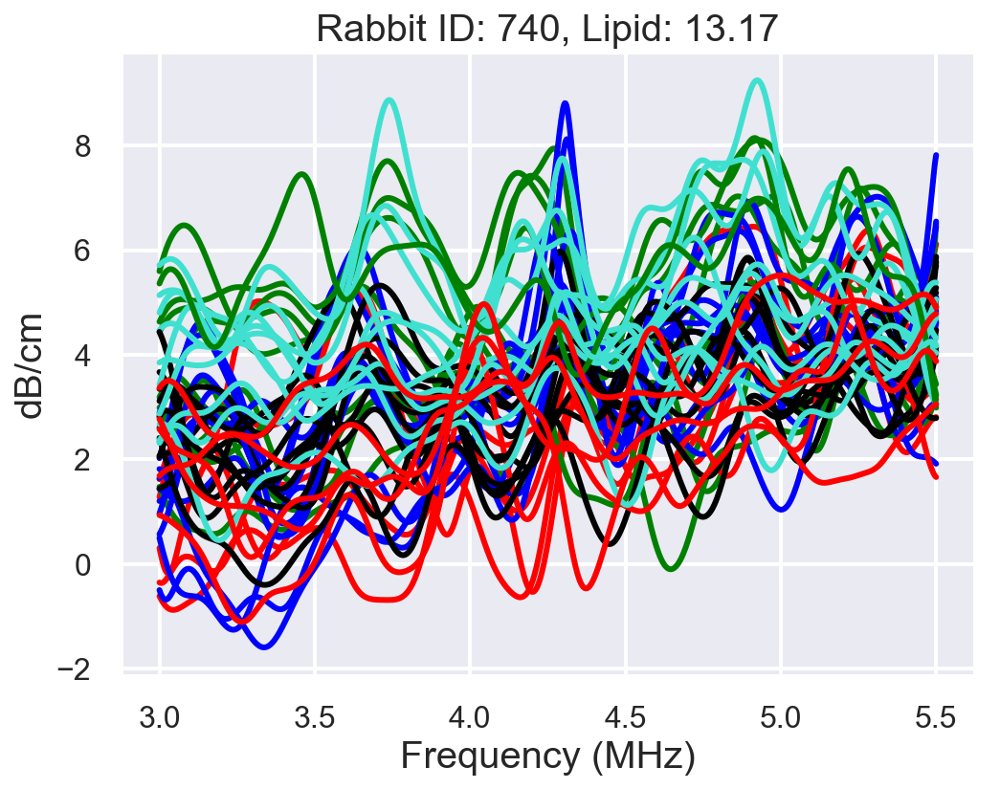

731


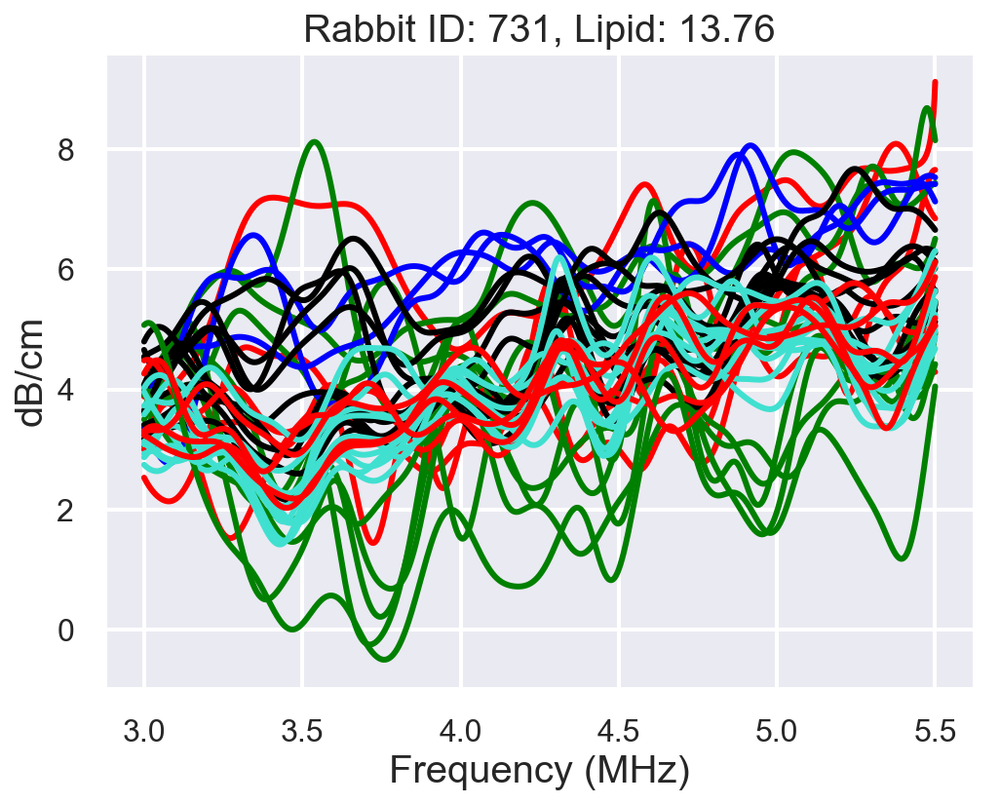

755


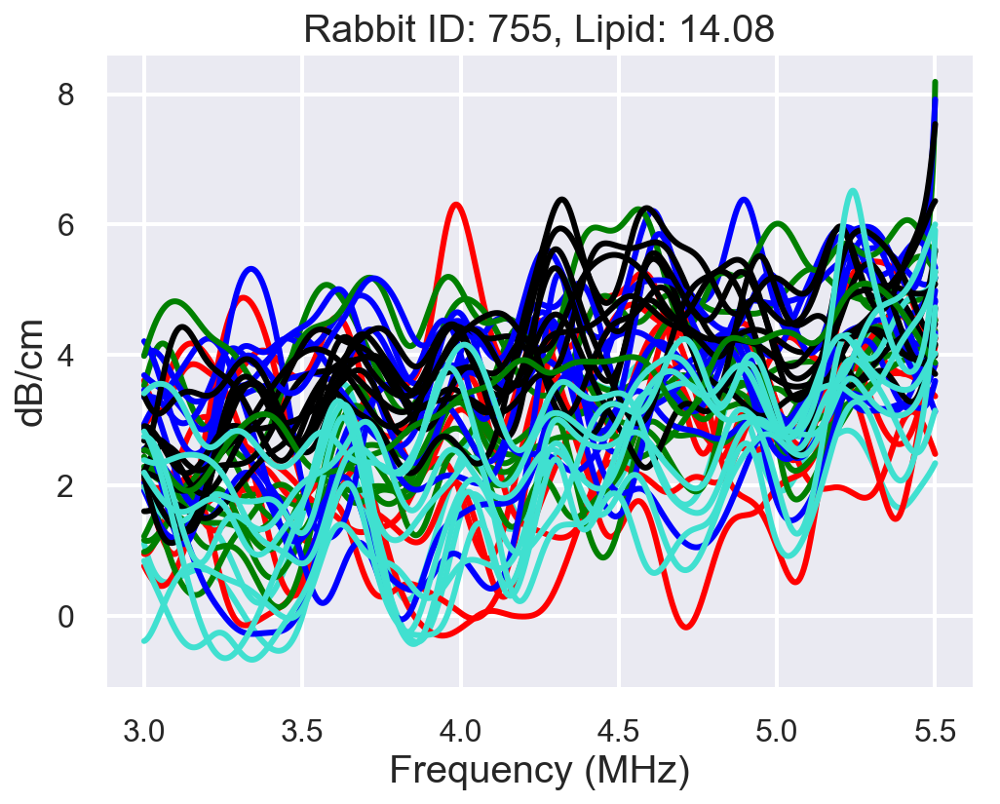

757


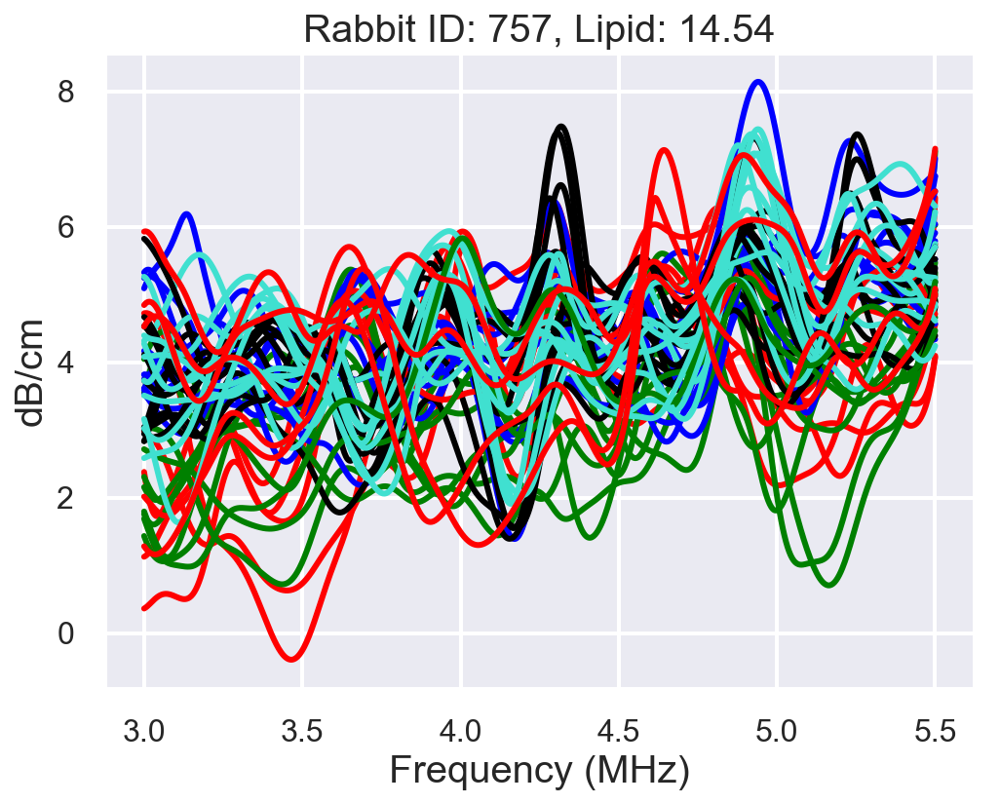

756


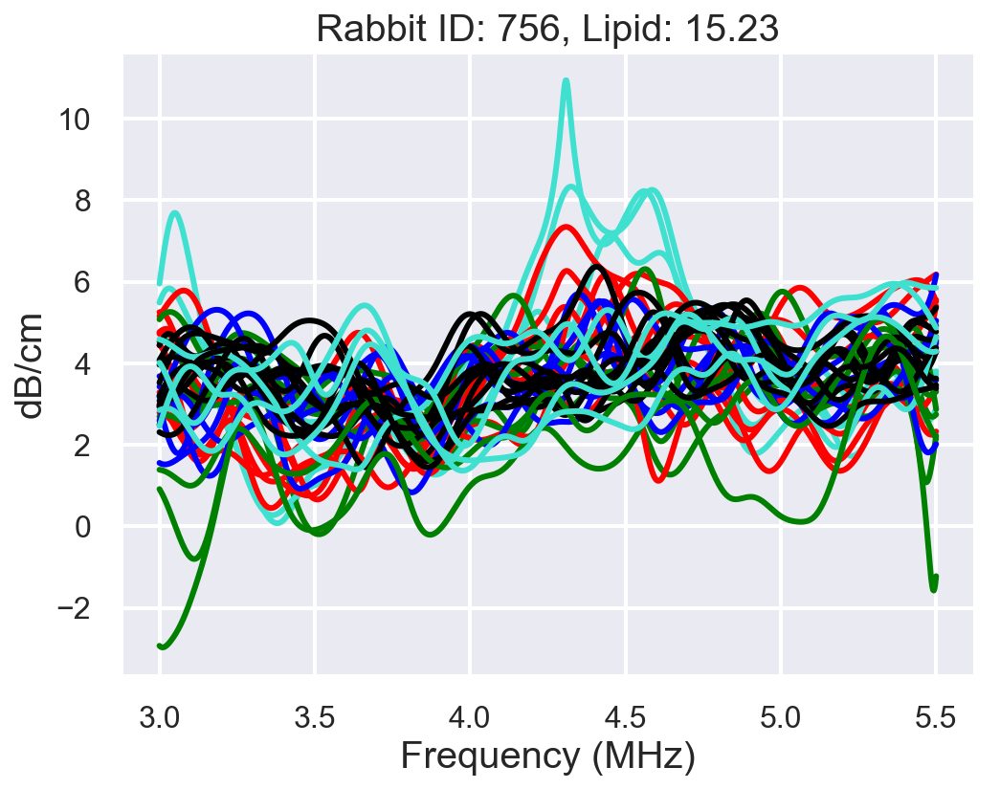

758


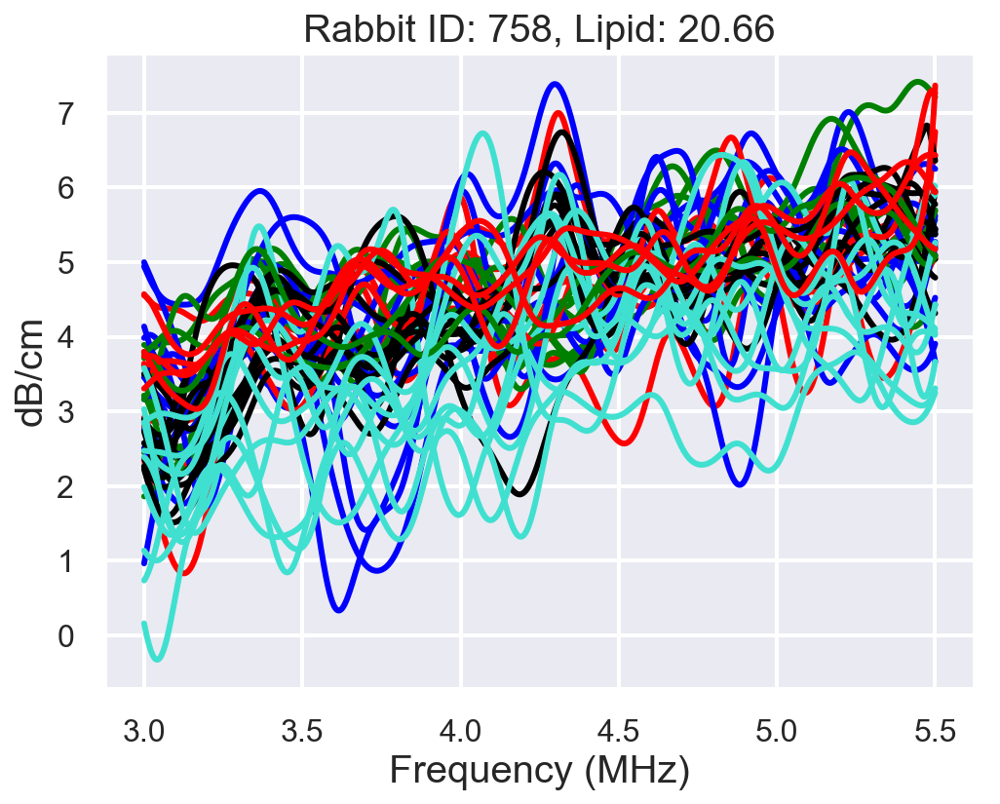

In [154]:
for idx, row in dataBase.iterrows():
    lipid = row.Lipid
    rabbit_number = str(int(row.Rabbit))
    atts = ATTs_dict[rabbit_number]
    depth = depth_dict[rabbit_number]
    print(rabbit_number)
    if (len(atts) == 0):
        print("NY" + rabbit_number)
        continue
    freq_key = next(iter(freq_att_dict[rabbit_number]))
    freq = freq_att_dict[rabbit_number][freq_key].flatten()
  
    plt.figure(figsize = (8, 6))
    for frame_ in atts:
        if (atts[frame_].shape[1] > 0):
            avg_att = np.mean(atts[frame_], axis = 1)
            #no_rois = bscs[frame_].shape[1]
            #mean_depth = np.round(np.max(depth[frame_]))
            #if (no_rois >0):
            plt.plot(freq, avg_att, color = filter_frame(frame_))
    plt.title("Rabbit ID: " + rabbit_number + ", Lipid: " + str(lipid))
    
    #plt.legend(bbox_to_anchor=(1.1, 1.05), ncol=3)
    plt.xlabel('Frequency (MHz)')
    plt.ylabel('dB/cm')
    plt.show()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
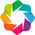

In [45]:
import holoviews as hv
hv.extension('bokeh')

In [46]:
def filter_class(x):
    if x > 10:
        color = 'red'
    else:
        color = 'blue'
    return color

In [47]:
curve_dict = {}
for idx, row in dataBase.iterrows():
    lipid = np.round(row.Lipid, 2)
    rabbit_number = str(int(row.Rabbit))
    bscs = BSCs_dict[rabbit_number]
    if (len(bscs) == 0):
        continue
    freq_key = next(iter(freq_bsc_dict[rabbit_number]))
    freq = freq_bsc_dict[rabbit_number][freq_key].flatten()
    
    rabbit_bsc = []
    for frame_ in bscs:
        if (bscs[frame_].shape[1] > 0):
            avg_bsc = np.mean(bscs[frame_], axis = 1)
            rabbit_bsc.append(avg_bsc)

    if (len(rabbit_bsc) ==0):
        continue
    rabbit_bsc  = np.mean(np.vstack(rabbit_bsc), axis = 0)
    curve = hv.Curve((freq, rabbit_bsc))
    curve = curve.options(tools = ['hover'], logy = True, color = filter_class(lipid))
    curve_dict[lipid] = curve
 

In [48]:
hmap = hv.HoloMap(curve_dict, kdims = 'Lipid')

In [49]:
%%output size=150
hmap

:HoloMap   [Lipid]
   :Curve   [x]   (y)